## For this, the main quantities that we'll be trying to estimate throughout time for a given region are:

- Number of active cases.
- Number of available beds at hospitals.
- Number of cumulated deaths.
- Number of recovered. 

# Germany - EDA

### This NoteBook starts with exploratory data analysis for the country Germany. The data contains various features regarding the COVID -19 outbreak.

In [2]:
# Importing required libraries
import numpy  as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import datetime as dt
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Reading CSV File
df_data=pd.read_csv(r"C:\Users\swati\Desktop\Covid-19 Project\linear-comprehensive-covid-data.csv")
pd.set_option('display.max_columns', None)   #display all cloumns

In [4]:
#View
df_data

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,0.026,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74861,ZWE,Africa,Zimbabwe,2021-03-10,36341.0,20.0,23.143,1489.0,0.0,1.571,2445.077,1.346,1.557,100.182,0.000,0.106,0.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2164.0,399018.0,26.847,0.146,1672.0,0.112,0.014,72.2,tests performed,35901.0,35901.0,NaN,140.0,1133.0,0.24,0.24,NaN,76.0,NaN,14862927.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
74862,ZWE,Africa,Zimbabwe,2021-03-11,36377.0,36.0,22.000,1492.0,3.0,1.286,2447.499,2.422,1.480,100.384,0.202,0.087,0.74,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1706.0,400724.0,26.961,0.115,1623.0,0.109,0.014,73.8,tests performed,36019.0,36019.0,NaN,118.0,766.0,0.24,0.24,NaN,52.0,NaN,14862927.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
74863,ZWE,Africa,Zimbabwe,2021-03-12,36423.0,46.0,25.000,1496.0,4.0,1.714,2450.594,3.095,1.682,100.653,0.269,0.115,0.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2109.0,402833.0,27.103,0.142,1705.0,0.115,0.015,68.2,tests performed,36283.0,36283.0,NaN,264.0,708.0,0.24,0.24,NaN,48.0,NaN,14862927.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571
74864,ZWE,Africa,Zimbabwe,2021

In [5]:
# Getting data-type
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74866 entries, 0 to 74865
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               74866 non-null  object 
 1   continent                              71169 non-null  object 
 2   location                               74866 non-null  object 
 3   date                                   74866 non-null  object 
 4   total_cases                            73719 non-null  float64
 5   new_cases                              73717 non-null  float64
 6   new_cases_smoothed                     72716 non-null  float64
 7   total_deaths                           64490 non-null  float64
 8   new_deaths                             64648 non-null  float64
 9   new_deaths_smoothed                    72716 non-null  float64
 10  total_cases_per_million                73317 non-null  float64
 11  ne

In [6]:
#counting number of null values
df_data.isnull().sum()

iso_code                                     0
continent                                 3697
location                                     0
date                                         0
total_cases                               1147
new_cases                                 1149
new_cases_smoothed                        2150
total_deaths                             10376
new_deaths                               10218
new_deaths_smoothed                       2150
total_cases_per_million                   1549
new_cases_per_million                     1551
new_cases_smoothed_per_million            2547
total_deaths_per_million                 10765
new_deaths_per_million                   10607
new_deaths_smoothed_per_million           2547
reproduction_rate                        14478
icu_patients                             67107
icu_patients_per_million                 67107
hosp_patients                            65529
hosp_patients_per_million                65529
weekly_icu_ad

In [7]:
pd.unique(df_data['location'])

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Asia',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czechia',
       'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador',
       'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia',
       'Europe', 'European Union', 'Faeroe Islands', 'Falkland Islands',
       'Fiji', 'Finland', 'Fran

### Getting Germany Country data

In [8]:
# Filtering to Germany
grouplocation=df_data.groupby(df_data.location)
df_germany=grouplocation.get_group("Germany")
pd.set_option('display.max_columns', None)

In [9]:
# view
df_germany

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
26027,DEU,Europe,Germany,2020-01-27,1.0,1.0,NaN,NaN,NaN,NaN,0.012,0.012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26028,DEU,Europe,Germany,2020-01-28,4.0,3.0,NaN,NaN,NaN,NaN,0.048,0.036,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26029,DEU,Europe,Germany,2020-01-29,4.0,0.0,NaN,NaN,NaN,NaN,0.048,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26030,DEU,Europe,Germany,2020-01-30,4.0,0.0,NaN,NaN,NaN,NaN,0.048,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26031,DEU,Europe,Germany,2020-01-31,5.0,1.0,NaN,NaN,NaN,NaN,0.060,0.012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26435,DEU,Europe,Germany,2021-03-10,2541781.0,21163.0,9838.286,72858.0,324.0,224.714,30337.328,252.590,117.424,869.594,3.867,2.682,1.15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8337410.0,5712952.0,2624458.0,267765.0,224318.0,9.95,6.82,3.13,2677.0,77.78,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26436,DEU,Europe,Germany,2021-03-11,2546526.0,4745.0,8888.571,73120.0,262.0,223.714,30393.962,56.634,106.089,872.721,3.127,2.670,1.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8607142.0,5923097.0,2684045.0,269732.0,229554.0,10.27,7.07,3.20,2740.0,77.78,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26437,DEU,Europe,Germany,2021-03-12,2559296.0,12770.0,9344.143,73348.0,228.0,213.714,30546.377,152.416,111.527,875.442,2.721,2.551,1.15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8863270.0,6113484.0,2749786.0,256128.0,229991.0,10.58,7.30,3.28,2745.0,77.78,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.

In [10]:
# shape and columns of filtered dataset
print("The shape of the data frame is", (df_germany.shape))
print("The columns of the data frame are" , (df_germany.columns))

The shape of the data frame is (413, 59)
The columns of the data frame are Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'new_vac

In [11]:
# Getting data-type
df_germany.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 413 entries, 26027 to 26439
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               413 non-null    object 
 1   continent                              413 non-null    object 
 2   location                               413 non-null    object 
 3   date                                   413 non-null    object 
 4   total_cases                            413 non-null    float64
 5   new_cases                              413 non-null    float64
 6   new_cases_smoothed                     408 non-null    float64
 7   total_deaths                           371 non-null    float64
 8   new_deaths                             371 non-null    float64
 9   new_deaths_smoothed                    408 non-null    float64
 10  total_cases_per_million                413 non-null    float64
 11  

In [12]:
#converting string date to date-time
df_germany['date'] = pd.to_datetime(df_germany['date']) 
pd.set_option('display.max_columns', None)
df_germany.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
26027,DEU,Europe,Germany,2020-01-27,1.0,1.0,NaN,NaN,NaN,NaN,0.012,0.012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26028,DEU,Europe,Germany,2020-01-28,4.0,3.0,NaN,NaN,NaN,NaN,0.048,0.036,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26029,DEU,Europe,Germany,2020-01-29,4.0,0.0,NaN,NaN,NaN,NaN,0.048,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26030,DEU,Europe,Germany,2020-01-30,4.0,0.0,NaN,NaN,NaN,NaN,0.048,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947
26031,DEU,Europe,Germany,2020-01-31,5.0,1.0,NaN,NaN,NaN,NaN,0.060,0.012,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,83783945.0,237.016,46.6,21.453,15.957,45229.245,NaN,156.139,8.31,28.2,33.1,NaN,8.0,81.33,0.947


In [13]:
df_germany.shape

(413, 59)

In [14]:
# Getting data-type
df_germany.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 413 entries, 26027 to 26439
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   iso_code                               413 non-null    object        
 1   continent                              413 non-null    object        
 2   location                               413 non-null    object        
 3   date                                   413 non-null    datetime64[ns]
 4   total_cases                            413 non-null    float64       
 5   new_cases                              413 non-null    float64       
 6   new_cases_smoothed                     408 non-null    float64       
 7   total_deaths                           371 non-null    float64       
 8   new_deaths                             371 non-null    float64       
 9   new_deaths_smoothed                    408 non-null    floa

In [15]:
#counting number of null values
df_germany.isnull().sum()

iso_code                                   0
continent                                  0
location                                   0
date                                       0
total_cases                                0
new_cases                                  0
new_cases_smoothed                         5
total_deaths                              42
new_deaths                                42
new_deaths_smoothed                        5
total_cases_per_million                    0
new_cases_per_million                      0
new_cases_smoothed_per_million             5
total_deaths_per_million                  42
new_deaths_per_million                    42
new_deaths_smoothed_per_million            5
reproduction_rate                         36
icu_patients                              92
icu_patients_per_million                  92
hosp_patients                            413
hosp_patients_per_million                413
weekly_icu_admissions                    413
weekly_icu

In [16]:
pd.unique(df_germany['tests_units'])
# tests_units has uniques value

array([nan, 'tests performed'], dtype=object)

In [17]:
#Removing unnecessary columns
df_germany.drop(columns=['hosp_patients', 'hosp_patients_per_million','weekly_icu_admissions', 'weekly_icu_admissions_per_million','weekly_hosp_admissions','weekly_hosp_admissions_per_million', 'new_tests','total_tests','total_tests_per_thousand','new_tests_per_thousand','tests_per_case','total_vaccinations','people_vaccinated','people_fully_vaccinated','new_vaccinations','new_vaccinations_smoothed','total_vaccinations_per_hundred','people_vaccinated_per_hundred','people_fully_vaccinated_per_hundred','new_vaccinations_smoothed_per_million','extreme_poverty','handwashing_facilities','tests_units'], axis =1 ,inplace =True)

In [18]:
df_germany.shape

(413, 36)

In [19]:
# Getting number of columns
df_germany.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'new_tests_smoothed',
       'new_tests_smoothed_per_thousand', 'positive_rate', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'cardiovasc_death_rate',
       'diabetes_prevalence', 'female_smokers', 'male_smokers',
       'hospital_beds_per_thousand', 'life_expectancy',
       'human_development_index'],
      dtype='object')

### Information >>>> Stringency Index - How ban implemented scaled to a value from 0 to 100 (100 = strictest).

In [20]:
# Checking skewness
df_germany_univar=df_germany.loc[:,'total_cases':'human_development_index']
df_germany_univar=df_germany_univar.select_dtypes([np.int, np.float])
for i, col in enumerate(df_germany_univar.columns):
    print("\nSkewness of "+col +" is", df_germany_univar[col].skew()) #measures skewness



Skewness of total_cases is 1.1923324655360932

Skewness of new_cases is 1.8786343774613092

Skewness of new_cases_smoothed is 1.0564450358443491

Skewness of total_deaths is 1.5138058497686644

Skewness of new_deaths is 1.9829937840727867

Skewness of new_deaths_smoothed is 1.4183654162110313

Skewness of total_cases_per_million is 1.1923324599242013

Skewness of new_cases_per_million is 1.8786337364225303

Skewness of new_cases_smoothed_per_million is 1.0564452638543758

Skewness of total_deaths_per_million is 1.5138059358862688

Skewness of new_deaths_per_million is 1.9830040233157544

Skewness of new_deaths_smoothed_per_million is 1.4183561319546771

Skewness of reproduction_rate is 2.647988173690016

Skewness of icu_patients is 0.7499753731440375

Skewness of icu_patients_per_million is 0.7499756736127056

Skewness of new_tests_smoothed is -0.02119122733405388

Skewness of new_tests_smoothed_per_thousand is -0.021176756928089763

Skewness of positive_rate is 0.4999131857611585

Sk

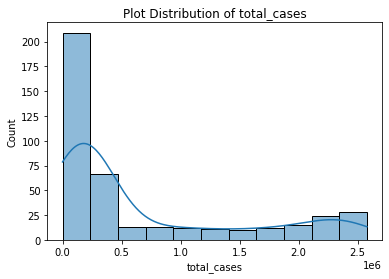

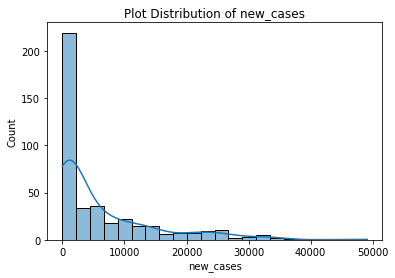

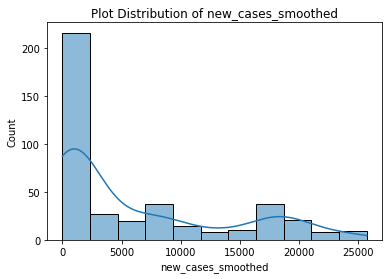

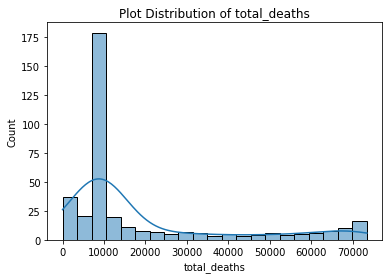

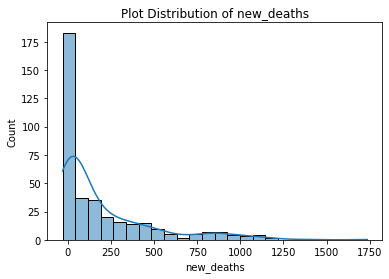

...

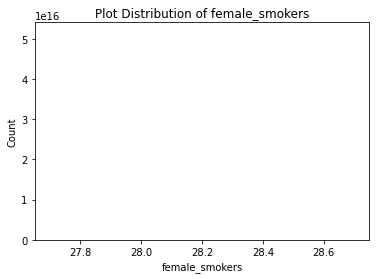

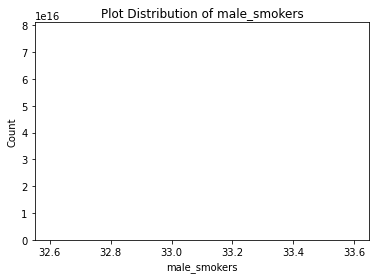

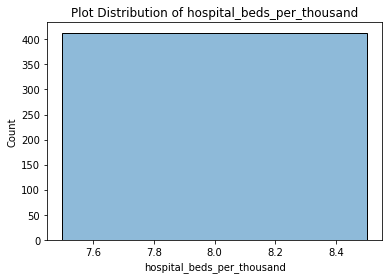

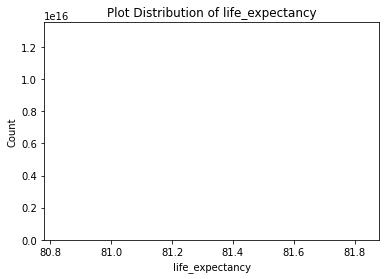

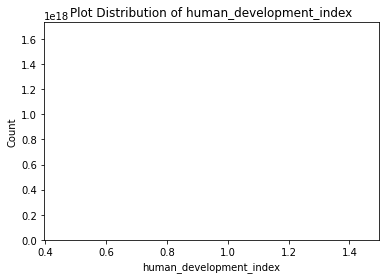

In [21]:
# Checking skewness Graphically
for i, col in enumerate(df_germany_univar.columns):
    plt.figure(i)
    sns.histplot(x=col, data=df_germany_univar,kde=True).set_title("Plot Distribution of "+col)

In [22]:
#counting number of null values
df_germany.isnull().sum()

iso_code                             0
continent                            0
location                             0
date                                 0
total_cases                          0
new_cases                            0
new_cases_smoothed                   5
total_deaths                        42
new_deaths                          42
new_deaths_smoothed                  5
total_cases_per_million              0
new_cases_per_million                0
new_cases_smoothed_per_million       5
total_deaths_per_million            42
new_deaths_per_million              42
new_deaths_smoothed_per_million      5
reproduction_rate                   36
icu_patients                        92
icu_patients_per_million            92
new_tests_smoothed                  62
new_tests_smoothed_per_thousand     62
positive_rate                      361
stringency_index                     1
population                           0
population_density                   0
median_age               

### Replacing Null Values with median(Positive Skewed), mean(Uniform Distribution) and mean(Negative Skewed) as per graph and skewness data.

In [23]:
df_germany['total_deaths']=df_germany['total_deaths'].fillna(df_germany['total_deaths'].median())
df_germany['new_deaths']=df_germany['new_deaths'].fillna(df_germany['new_deaths'].median())
df_germany['new_cases_smoothed_per_million']=df_germany['new_cases_smoothed_per_million'].fillna(df_germany['new_cases_smoothed_per_million'].median())
df_germany['total_deaths_per_million']=df_germany['total_deaths_per_million'].fillna(df_germany['total_deaths_per_million'].median())
df_germany['new_deaths_per_million']=df_germany['new_deaths_per_million'].fillna(df_germany['new_deaths_per_million'].median())
df_germany['new_deaths_smoothed_per_million']=df_germany['new_deaths_smoothed_per_million'].fillna(df_germany['new_deaths_smoothed_per_million'].median())
df_germany['reproduction_rate']=df_germany['reproduction_rate'].fillna(df_germany['reproduction_rate'].median())
df_germany['icu_patients']=df_germany['icu_patients'].fillna(df_germany['icu_patients'].median())
df_germany['icu_patients_per_million']=df_germany['icu_patients_per_million'].fillna(df_germany['icu_patients_per_million'].median())
df_germany['new_tests_smoothed']=df_germany['new_tests_smoothed'].fillna(df_germany['new_tests_smoothed'].mean())
df_germany['new_tests_smoothed_per_thousand']=df_germany['new_tests_smoothed_per_thousand'].fillna(df_germany['new_tests_smoothed_per_thousand'].mean())
df_germany['stringency_index']=df_germany['stringency_index'].fillna(df_germany['stringency_index'].mean())
df_germany['new_cases_smoothed']=df_germany['new_cases_smoothed'].fillna(df_germany['new_cases_smoothed'].median())
df_germany['new_deaths_smoothed']=df_germany['new_deaths_smoothed'].fillna(df_germany['new_deaths_smoothed'].median())
df_germany['positive_rate']=df_germany['positive_rate'].fillna(df_germany['positive_rate'].mean())

In [24]:
#counting number of null values
df_germany.isnull().sum()

iso_code                           0
continent                          0
location                           0
date                               0
total_cases                        0
new_cases                          0
new_cases_smoothed                 0
total_deaths                       0
new_deaths                         0
new_deaths_smoothed                0
total_cases_per_million            0
new_cases_per_million              0
new_cases_smoothed_per_million     0
total_deaths_per_million           0
new_deaths_per_million             0
new_deaths_smoothed_per_million    0
reproduction_rate                  0
icu_patients                       0
icu_patients_per_million           0
new_tests_smoothed                 0
new_tests_smoothed_per_thousand    0
positive_rate                      0
stringency_index                   0
population                         0
population_density                 0
median_age                         0
aged_65_older                      0
a

In [25]:
df_germany.describe(include=['object'])

,iso_code,continent,location
count,413,413,413
unique,1,1,1
top,DEU,Europe,Germany
freq,413,413,413


In [26]:
pd.set_option('display.max_columns', None)
df_germany.describe(include=['float'])

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,hospital_beds_per_thousand,life_expectancy,human_development_index
count,4.130000e+02,413.000000,413.000000,413.000000,413.000000,413.00000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.000000,413.0,4.130000e+02,4.130000e+02,413.000,4.130000e+02,413.000,4.130000e+02,413.00,4.130000e+02,4.130000e+02,413.0,4.130000e+02,4.130000e+02
mean,6.797313e+05,6244.169492,6190.348638,18384.808717,182.859564,177.18108,8112.906896,74.527046,73.884668,219.431174,2.182545,2.114768,1.144358,1683.089588,20.088383,129564.125356,1.546422,0.051365,60.473471,83783945.0,2.370160e+02,4.660000e+01,21.453,1.595700e+01,45229.245,1.561390e+02,8.31,2.820000e+01,3.310000e+01,8.0,8.133000e+01,9.470000e-01
std,8.182060e+05,8605.289408,7380.867753,19962.195957,280.367304,246.64209,9765.665151,102.708083,88.094060,238.258001,3.346293,2.943808,0.430834,1650.324535,19.697437,56195.335639,0.670714,0.014555,20.128814,0.0,5.691236e-14,2.134214e-14,0.000,5.335534e-15,0.000,2.845618e-14,0.00,1.067107e-14,7.114045e-15,0.0,2.845618e-14,2.223139e-16
min,1.000000e+00,0.000000,0.000000,2.000000,-31.000000,0.00000,0.012000,0.000000,0.000000,0.024000,-0.370000,0.000000,0.670000,200.000000,2.387000,46828.000000,0.559000,0.006000,5.560000,83783945.0,2.370160e+02,4.660000e+01,21.453,1.595700e+01,45229.245,1.561390e+02,8.31,2.820000e+01,3.310000e+01,8.0,8.133000e+01,9.470000e-01
25%,1.713240e+05,535.000000,565.571000,8895.000000,10.000000,5.28600,2044.831000,6.385000,6.750000,106.166000,0.119000,0.063000,0.950000,359.000000,4.285000,71643.000000,0.855000,0.051365,55.090000,83783945.0,2.370160e+02,4.660000e+01,21.453,1.595700e+01,45229.245,1.561390e+02,8.31,2.820000e+01,3.310000e+01,8.0,8.133000e+01,9.470000e-01
50%,2.312920e+05,1842.000000,1874.428500,9345.000000,49.000000,37.21400,2760.577000,21.985000,22.372000,111.537000,0.585000,0.444000,1.070000,971.000000,11.589000,129564.125356,1.546422,0.051365,62.040000,83783945.0,2.370160e+02,4.660000e+01,21.453,1.595700e+01,45229.245,1.561390e+02,8.31,2.820000e+01,3.310000e+01,8.0,8.133000e+01,9.470000e-01
75%,1.094678e+06,9197.000000,9861.000000,17177.000000,250.000000,248.42900,13065.486000,109.770000,117.696000,205.015000,2.984000,2.965000,1.190000,2654.000000,31.677000,166494.000000,1.987000,0.051365,76.850000,83783945.0,2.370160e+02,4.660000e+01,21.453,1.595700e+01,45229.245,1.561390e+02,8.31,2.820000e+01,3.310000e+01,8.0,8.133000e+01,9.470000e-01
max,2.578842e+06,49044.000000,25757.000000,73463.000000,1734.000000,894.42900,30779.668000,585.363000,307.422000,876.815000,20.696000,10.675000,3.040000,5745.000000,68.569000,238862.000000,2.851000,0.154000,85.190000,83783945.0,2.370160e+02,4.660000e+01,21.453,1.595700e+01,45229.245,1.561390e+02,8.31,2.820000e+01,3.310000e+01,8.0,8.133000e+01,9.470000e-01


# From the above describe function and plot disribtion graph, we can see that these columns have constant values over the data frame.

1.cardiovasc_death_rate (1.561390e+02)

2.diabetes_prevalence (8.31)

3.male_smokers (3.310000e+01)

4.female_smokers(2.820000e+01)

5.hospital_beds_per_thousand (8.0)

6.life_expectancy (8.133000e+01)

7.human_development_index(9.470000e-01)

8.gdp_per_capita for Germany (45229.245)

9.aged_65_older (21.453)

10.aged_70_older (15.957)

11.median_age (46.6)

12.population_density (237.016)

13.population (83783945)


14.iso_code (DEU)


15.continent (Europe)


16.location (Germany)

In [27]:
#Again Removing unnecessary columns
df_germany.drop(columns=['cardiovasc_death_rate','diabetes_prevalence','male_smokers','female_smokers','life_expectancy','human_development_index','gdp_per_capita','aged_65_older','aged_70_older','median_age','iso_code','continent'], axis =1 ,inplace =True)

In [28]:
df_germany.shape

(413, 24)

In [29]:
df_germany.columns

Index(['location', 'date', 'total_cases', 'new_cases', 'new_cases_smoothed',
       'total_deaths', 'new_deaths', 'new_deaths_smoothed',
       'total_cases_per_million', 'new_cases_per_million',
       'new_cases_smoothed_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'new_deaths_smoothed_per_million',
       'reproduction_rate', 'icu_patients', 'icu_patients_per_million',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'stringency_index', 'population', 'population_density',
       'hospital_beds_per_thousand'],
      dtype='object')

### Number of Cases Recovered

In [30]:
df_germany['recovered_cases'] = df_germany['total_cases']-df_germany['total_deaths'] - df_germany['new_cases']

### Total Number of Cases Recovered

In [31]:
tnocr=df_germany["recovered_cases"].sum(axis = 0, skipna = True)
print("Total Number of cases recovered:", tnocr)

Total Number of cases recovered: 270557277.0


Text(0.5, 1.0, 'Plot Distribution of recovered_cases')

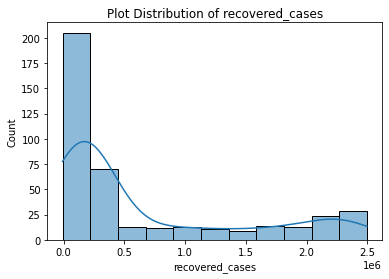

In [32]:
sns.histplot(x=df_germany.recovered_cases, kde=True).set_title("Plot Distribution of recovered_cases")

Text(0.5, 1.0, 'recovered_cases vs date for Germany')

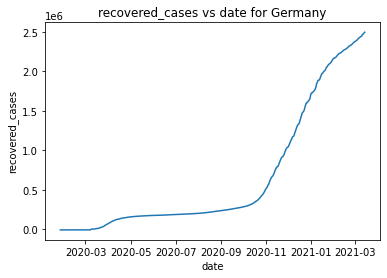

In [33]:
sns.lineplot(x=df_germany.date,y='recovered_cases',data=df_germany).set_title("recovered_cases vs date for Germany")

### Number of availabale bed at Hospital

In [34]:
df_germany['total_beds_available'] = (df_germany['population']/1000)*df_germany['hospital_beds_per_thousand']

### Total Number of available bed at Hospital

In [35]:
nobahpt=(df_germany.population.unique()/1000)*df_germany.hospital_beds_per_thousand.unique()
print("Total Number of available bed at hospital", float(nobahpt))

Total Number of available bed at hospital 670271.56


Text(0.5, 1.0, 'Plot Distribution of hospital_beds_per_thousand')

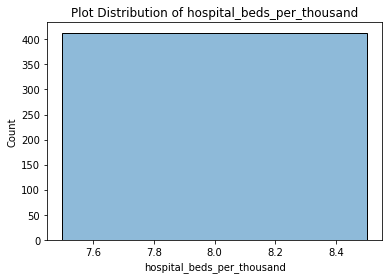

In [36]:
sns.histplot(x=df_germany.hospital_beds_per_thousand, kde=True).set_title("Plot Distribution of hospital_beds_per_thousand")

### Number of active cases

In [37]:
df_germany['active_case'] = df_germany['total_cases'] - df_germany['recovered_cases'] - df_germany['new_deaths']

### Total Number of active cases

In [38]:
tnoac=df_germany["active_case"].sum(axis = 0, skipna = True)
print("Total Number of active cases: ", tnoac)

Total Number of active cases:  10096247.0


Text(0.5, 1.0, 'Plot Distribution of active_case')

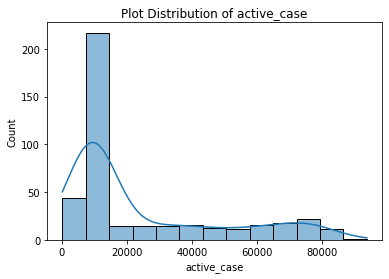

In [39]:
sns.histplot(x=df_germany.active_case, kde=True).set_title("Plot Distribution of active_case")

Text(0.5, 1.0, 'active_case vs date for Germany')

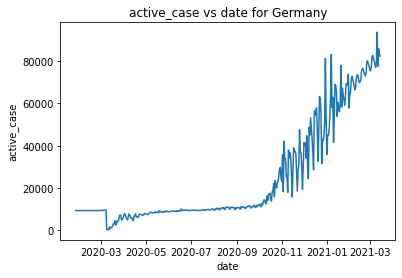

In [40]:
sns.lineplot(x=df_germany.date,y='active_case',data=df_germany).set_title("active_case vs date for Germany")

### Number of cumulated deaths

In [41]:
tnocd=df_germany["new_deaths"].sum(axis = 0, skipna = True)
print("Total Number of cumulated deaths: ", tnocd)

Total Number of cumulated deaths:  75521.0


Text(0.5, 1.0, 'Plot Distribution of new_deaths')

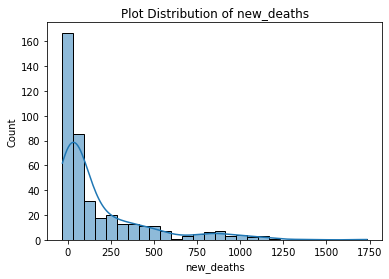

In [42]:
sns.histplot(x=df_germany.new_deaths, kde=True).set_title("Plot Distribution of new_deaths")

In [43]:
# pip install pandas-profiling          (we can quickly do an EDA and generate EDA report)
# pip install U-wbdata                  (information from the World Bank's various databases)
from pandas_profiling import ProfileReport

# Generate Report 
profile= ProfileReport(df_germany)
profile.to_file(output_file="germany.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


In [44]:
df_corr = df_germany[['total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million','stringency_index','recovered_cases','positive_rate','new_tests_smoothed',
       'new_tests_smoothed_per_thousand']].corr()

df_corr

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,stringency_index,recovered_cases,positive_rate,new_tests_smoothed,new_tests_smoothed_per_thousand
total_cases,1.000000,0.550045,0.659361,0.958579,0.702146,0.838737,1.000000,0.550046,0.659361,0.958579,0.702144,0.838737,0.616135,0.999979,0.221102,0.463893,0.463895
new_cases,0.550045,1.000000,0.859657,0.360298,0.679499,0.611777,0.550045,1.000000,0.859657,0.360298,0.679500,0.611773,0.436325,0.546674,0.124529,0.611740,0.611750
new_cases_smoothed,0.659361,0.859657,1.000000,0.439111,0.674769,0.750589,0.659361,0.859657,1.000000,0.439111,0.674768,0.750588,0.515391,0.658812,0.315433,0.691184,0.691199
total_deaths,0.958579,0.360298,0.439111,1.000000,0.586439,0.716461,0.958579,0.360299,0.439111,1.000000,0.586439,0.716460,0.492608,0.958328,0.153176,0.344655,0.344653
new_deaths,0.702146,0.679499,0.674769,0.586439,1.000000,0.866254,0.702146,0.679499,0.674769,0.586439,1.000000,0.866248,0.516189,0.701131,0.118500,0.336519,0.336521
new_deaths_smoothed,0.838737,0.611777,0.750589,0.716461,0.866254,1.000000,0.838737,0.611777,0.750589,0.716461,0.866252,1.000000,0.635031,0.839289,0.291748,0.365135,0.365135
total_cases_per_million,1.000000,0.550045,0.659361,0.958579,0.702146,0.838737,1.000000,0.550046,0.659361,0.958579,0.702144,0.838737,0.616135,0.999979,0.221102,0.463893,0.463895
new_cases_per_million,0.550046,1.000000,0.859657,0.360299,0.679499,0.611777,0.550046,1.000000,0.859657,0.360299,0.679500,0.611774,0.436325,0.546674,0.124529,0.611740,0.611750
new_cases_smoothed_per_million,0.659361,0.859657,1.000000,0.439111,0.674769,0.750589,0.659361,0.859657,1.000000,0.439111,0.674768,0.750588,0.515390,0.658812,0.315433,0.691184,0.691199
total_deaths_per_million,0.958579,0.360298,0.439111,1.000000,0.586439,0.716461,0.958579,0.360299,0.439111,1.000000,0.586439,0.716460,0.492607,0.958328,0.153176,0.344655,0.344653


<AxesSubplot:>

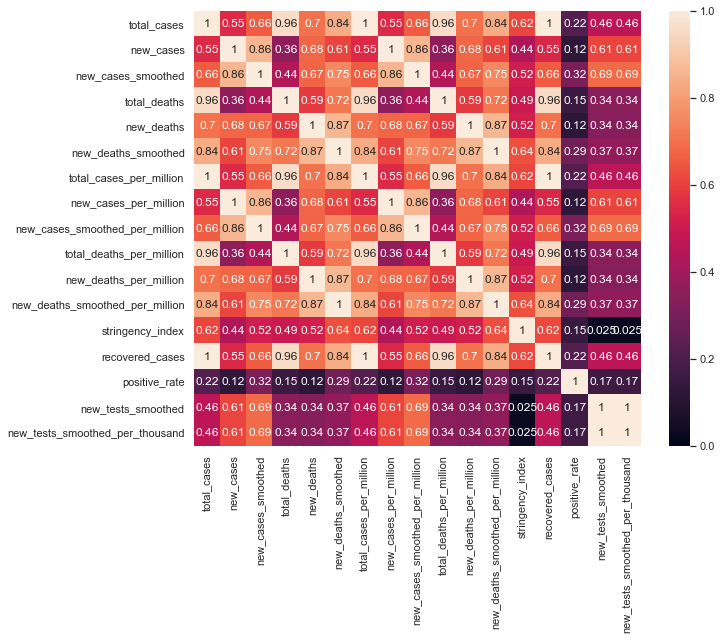

In [45]:
sns.set(rc={'figure.figsize':(10,8)})
sns.heatmap(df_corr, vmin=0, vmax=1,annot=True)

In [46]:
df_germany['month'] = df_germany['date'].dt.month_name()
print("Starting date-",df_germany['date'].min())
print("End date-",df_germany['date'].max())

Starting date- 2020-01-27 00:00:00
End date- 2021-03-14 00:00:00


In [47]:
print("Length of data with respect to days:",(df_germany['date'].max() - df_germany['date'].min()))

Length of data with respect to days: 412 days 00:00:00


In [48]:
pd.set_option('display.max_columns', None)
df_germany

,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,stringency_index,population,population_density,hospital_beds_per_thousand,recovered_cases,total_beds_available,active_case,month
26027,Germany,2020-01-27,1.0,1.0,1874.4285,9345.0,49.0,37.214,0.012,0.012,22.372,111.537,0.585,0.444,1.07,971.0,11.589,129564.125356,1.546422,0.051365,5.560000,83783945.0,237.016,8.0,-9345.0,670271.56,9297.0,January
26028,Germany,2020-01-28,4.0,3.0,1874.4285,9345.0,49.0,37.214,0.048,0.036,22.372,111.537,0.585,0.444,1.07,971.0,11.589,129564.125356,1.546422,0.051365,5.560000,83783945.0,237.016,8.0,-9344.0,670271.56,9299.0,January
26029,Germany,2020-01-29,4.0,0.0,1874.4285,9345.0,49.0,37.214,0.048,0.000,22.372,111.537,0.585,0.444,1.07,971.0,11.589,129564.125356,1.546422,0.051365,5.560000,83783945.0,237.016,8.0,-9341.0,670271.56,9296.0,January
26030,Germany,2020-01-30,4.0,0.0,1874.4285,9345.0,49.0,37.214,0.048,0.000,22.372,111.537,0.585,0.444,1.07,971.0,11.589,129564.125356,1.546422,0.051365,5.560000,83783945.0,237.016,8.0,-9341.0,670271.56,9296.0,January
26031,Germany,2020-01-31,5.0,1.0,1874.4285,9345.0,49.0,37.214,0.060,0.012,22.372,111.537,0.585,0.444,1.07,971.0,11.589,129564.125356,1.546422,0.051365,5.560000,83783945.0,237.016,8.0,-9341.0,670271.56,9297.0,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26435,Germany,2021-03-10,2541781.0,21163.0,9838.2860,72858.0,324.0,224.714,30337.328,252.590,117.424,869.594,3.867,2.682,1.15,971.0,11.589,129564.125356,1.546422,0.051365,77.780000,83783945.0,237.016,8.0,2447760.0,670271.56,93697.0,March
26436,Germany,2021-03-11,2546526.0,4745.0,8888.5710,73120.0,262.0,223.714,30393.962,56.634,106.089,872.721,3.127,2.670,1.14,971.0,11.589,129564.125356,1.546422,0.051365,77.780000,83783945.0,237.016,8.0,2468661.0,670271.56,77603.0,March
26437,Germany,2021-03-12,2559296.0,12770.0,9344.1430,73348.0,228.0,213.714,30546.377,152.416,111.527,875.442,2.721,2.551,1.15,971.0,11.589,129564.125356,1.546422,0.051365,77.780000,83783945.0,237.016,8.0,2473178.0,670271.56,85890.0,March
26438,Germany,2021-03-13,2569864.0,10568.0,9673.2860,73369.0,21.0,202.571,30672.511,126.134,115.455,875.693,0.251,2.418,1.15,971.0,11.589,129564.125356,1.546422,0.051365,77.780000,83783945.0,237.016,8.0,2485927.0,670271.56,83916.0,March


## The below line plot gives the relation between how the each column vaires with respect to each day. 

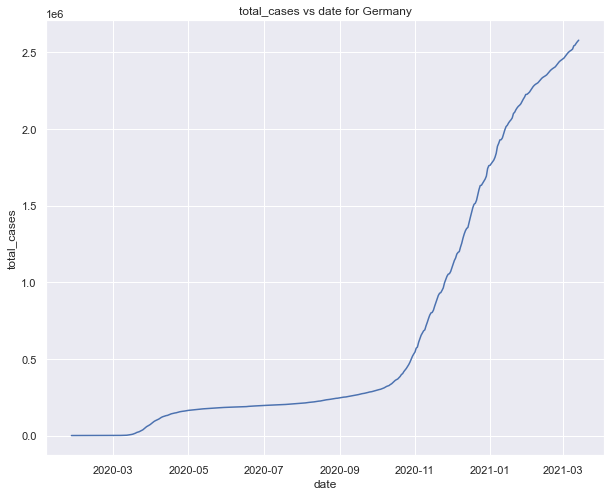

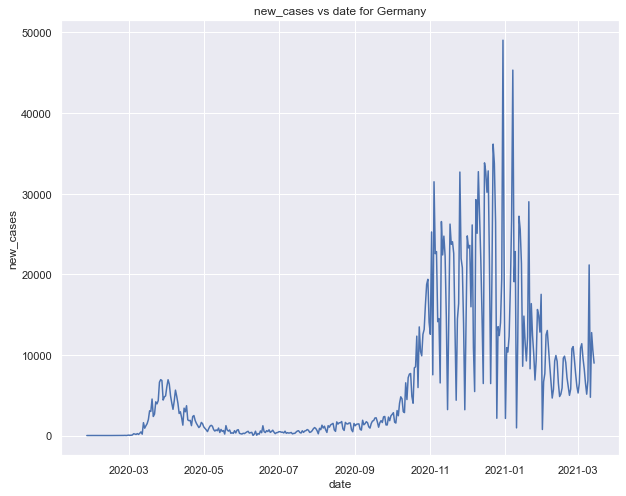

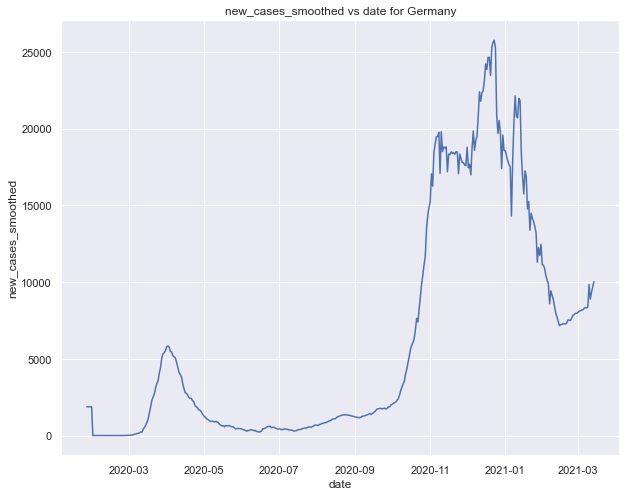

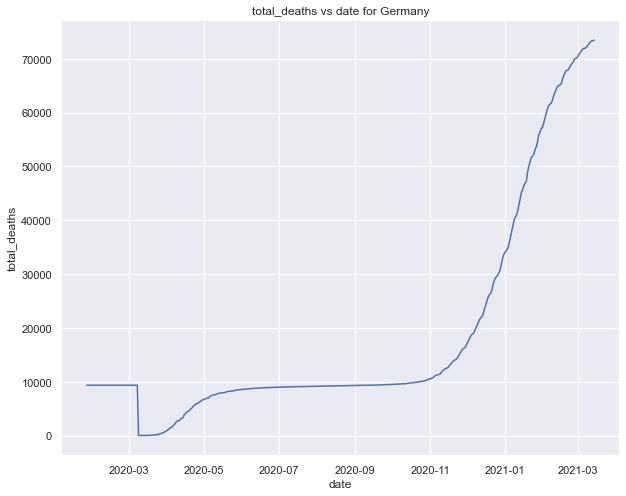

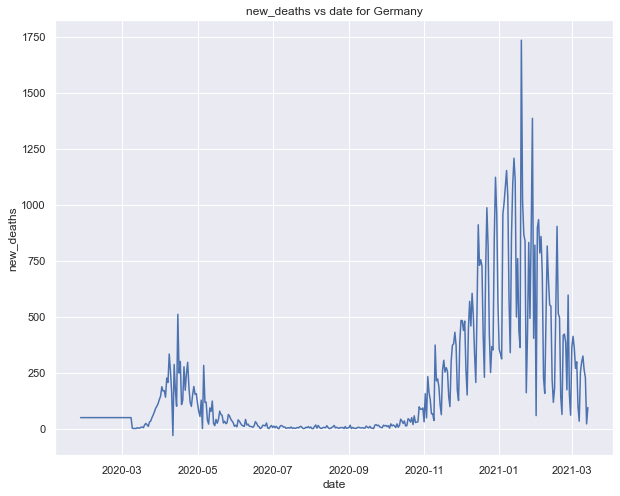

...

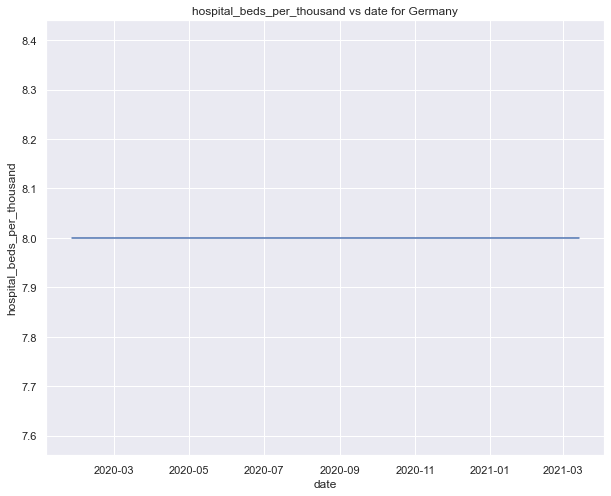

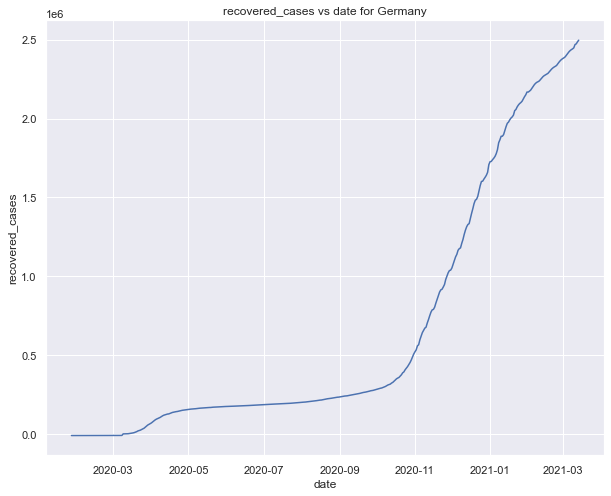

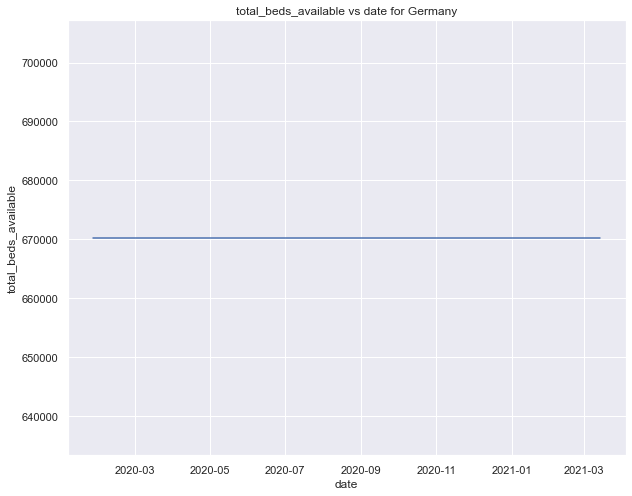

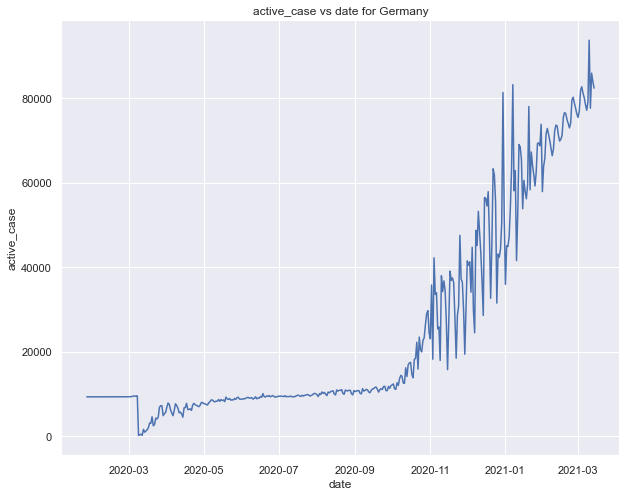

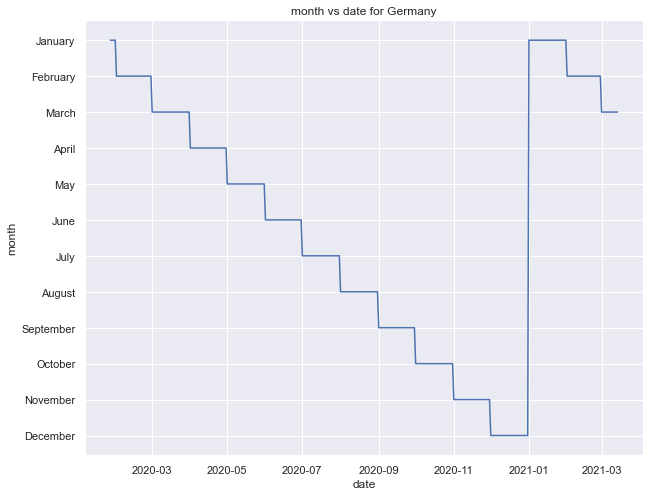

In [49]:
df_germany_bivar=df_germany.loc[:,'date':]
for i, feature in enumerate(df_germany_bivar.columns[1:]):
    plt.figure(i)
    g = sns.lineplot(x=df_germany_bivar.date,y=feature,data=df_germany_bivar).set_title(feature +" vs date for Germany")

In [50]:
df_grouped = df_germany.groupby(df_germany.month)
pd.set_option('display.max_columns', None)
df_germany[df_germany['month'] == 'April']

,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,stringency_index,population,population_density,hospital_beds_per_thousand,recovered_cases,total_beds_available,active_case,month
26092,Germany,2020-04-01,77872.0,6064.0,5792.714,920.0,145.0,102.000,929.438,72.377,69.139,10.981,1.731,1.217,1.38,1784.0,21.293,56395.0,0.673,0.051365,76.85,83783945.0,237.016,8.0,70888.0,670271.56,6839.0,April
26093,Germany,2020-04-02,84794.0,6922.0,5836.571,1107.0,187.0,120.000,1012.055,82.617,69.662,13.213,2.232,1.432,1.32,2102.0,25.088,57212.0,0.683,0.051365,76.85,83783945.0,237.016,8.0,76765.0,670271.56,7842.0,April
26094,Germany,2020-04-03,91159.0,6365.0,5755.429,1275.0,168.0,133.286,1088.025,75.969,68.694,15.218,2.005,1.591,1.26,2361.0,28.180,58029.0,0.693,0.051365,76.85,83783945.0,237.016,8.0,83519.0,670271.56,7472.0,April
26095,Germany,2020-04-04,96092.0,4933.0,5485.286,1444.0,169.0,144.429,1146.902,58.878,65.469,17.235,2.017,1.724,1.19,2471.0,29.493,58846.0,0.702,0.051365,76.85,83783945.0,237.016,8.0,89715.0,670271.56,6208.0,April
26096,Germany,2020-04-05,100123.0,4031.0,5432.571,1584.0,140.0,150.143,1195.014,48.112,64.840,18.906,1.671,1.792,1.14,2528.0,30.173,59664.0,0.712,0.090000,76.85,83783945.0,237.016,8.0,94508.0,670271.56,5475.0,April
26097,Germany,2020-04-06,103374.0,3251.0,5212.714,1810.0,226.0,166.429,1233.816,38.802,62.216,21.603,2.697,1.986,1.09,2551.0,30.447,59023.0,0.704,0.051365,76.85,83783945.0,237.016,8.0,98313.0,670271.56,4835.0,April
26098,Germany,2020-04-07,107663.0,4289.0,5122.143,2016.0,206.0,177.286,1285.008,51.191,61.135,24.062,2.459,2.116,1.05,2641.0,31.522,58382.0,0.697,0.051365,76.85,83783945.0,237.016,8.0,101358.0,670271.56,6099.0,April
26099,Germany,2020-04-08,113296.0,5633.0,5060.571,2349.0,333.0,204.143,1352.240,67.232,60.400,28.036,3.975,2.437,1.02,2654.0,31.677,57741.0,0.689,0.051365,76.85,83783945.0,237.016,8.0,105314.0,670271.56,7649.0,April
26100,Germany,2020-04-09,118181.0,4885.0,4769.571,2607.0,258.0,214.286,1410.545,58.305,56.927,31.116,3.079,2.558,0.98,2714.0,32.393,57100.0,0.682,0.051365,76.85,83783945.0,237.016,8.0,110689.0,670271.56,7234.0,April
26101,Germany,2020-04-10,122171.0,3990.0,4430.286,2767.0,160.0,213.143,1458.167,47.622,52.878,33.025,1.910,2.544,0.93,2702.0,32.250,56459.0,0.674,0.051365,76.85,83783945.0,237.016,8.0,115414.0,670271.56,6597.0,April


In [51]:
df_grouped = df_germany.groupby(df_germany.month).sum()
new_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df_grouped = df_grouped.reindex(new_order, axis=0)
df_grouped = df_grouped.loc[:,:'stringency_index']

In [52]:
pd.set_option('display.max_columns', None)
df_grouped

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,stringency_index
month,,,,,,,,,,,,,,,,,,,
January,62555476.0,465144.0,516066.8565,1474793.0,23617.0,24103.927,746628.441,5551.710,6159.495,17602.333,281.880,287.694,33.57,160803.0,1919.259,5.572882e+06,66.516108,2.162327,2616.650000
February,65661216.0,224710.0,232596.2840,2095518.0,14410.0,14023.286,783696.874,2682.021,2776.145,25010.977,171.994,167.374,56.49,65206.0,778.246,8.170982e+06,97.524228,2.984365,2614.770000
March,35798432.0,200276.0,177461.5750,1089630.0,4478.0,4040.713,427270.786,2390.390,2118.085,13005.239,53.453,48.232,89.91,41317.0,493.126,5.319110e+06,63.486806,2.382981,2583.623471
April,3942925.0,91201.0,103126.4270,115270.0,5848.0,5706.001,47060.626,1088.525,1230.861,1375.800,69.800,68.106,26.41,77797.0,928.545,1.603652e+06,19.140000,1.622500,2305.500000
May,5427815.0,20401.0,23220.1400,242992.0,1917.0,2287.144,64783.475,243.495,277.144,2900.221,22.878,27.299,22.78,40123.0,478.885,1.690163e+06,20.172000,1.442500,1979.100000
June,5670762.0,12008.0,12121.1410,264281.0,450.0,511.715,67683.157,143.320,144.673,3154.316,5.367,6.108,29.79,13517.0,161.334,1.637767e+06,19.549000,1.376500,1839.830000
July,6265079.0,14981.0,13765.0000,281460.0,157.0,170.713,74776.606,178.806,164.289,3359.355,1.876,2.040,33.60,8287.0,98.908,2.361490e+06,28.187000,1.413865,1760.610000
August,7024733.0,34403.0,33426.8550,286250.0,156.0,159.713,83843.428,410.615,398.962,3416.525,1.865,1.904,36.34,7283.0,86.925,3.853393e+06,45.994000,1.381500,1795.740000
September,8023521.0,48111.0,45457.9970,281455.0,192.0,172.575,95764.421,574.225,542.563,3359.293,2.294,2.059,33.89,7727.0,92.223,4.883943e+06,58.291000,1.376500,1514.890000


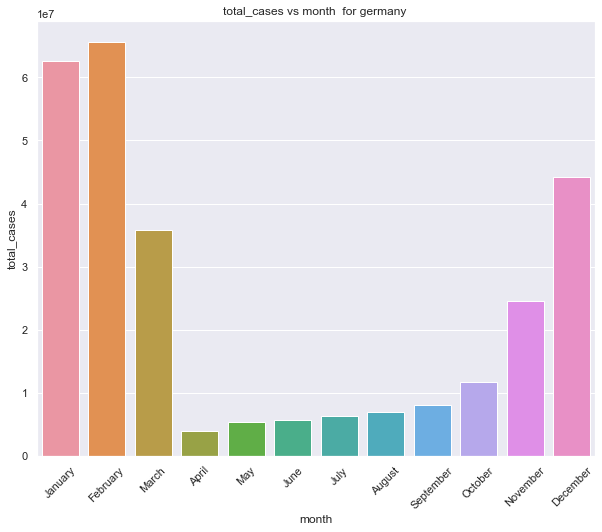

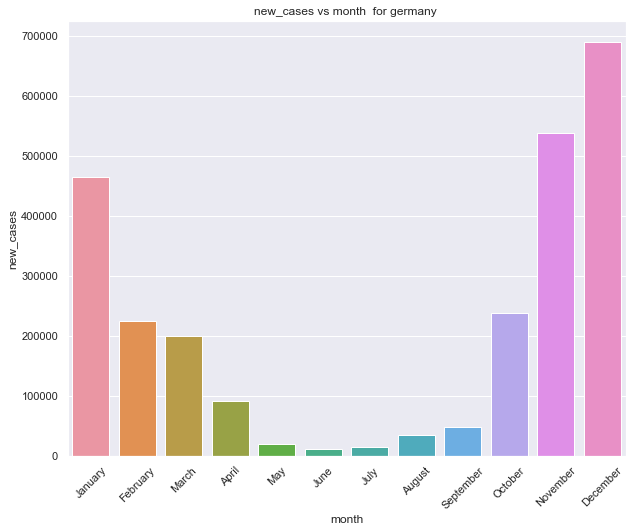

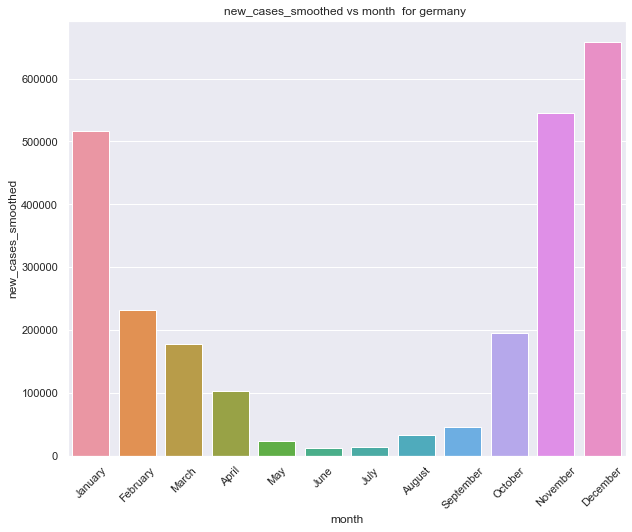

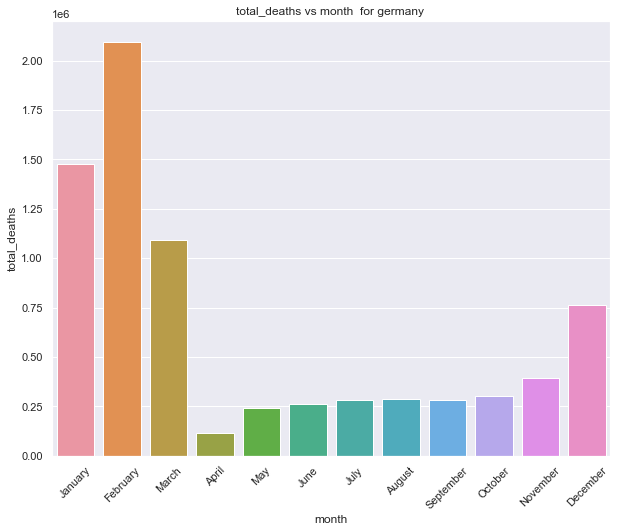

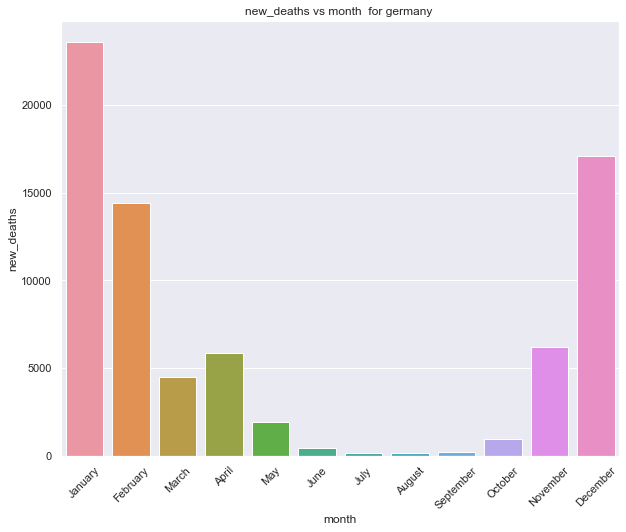

...

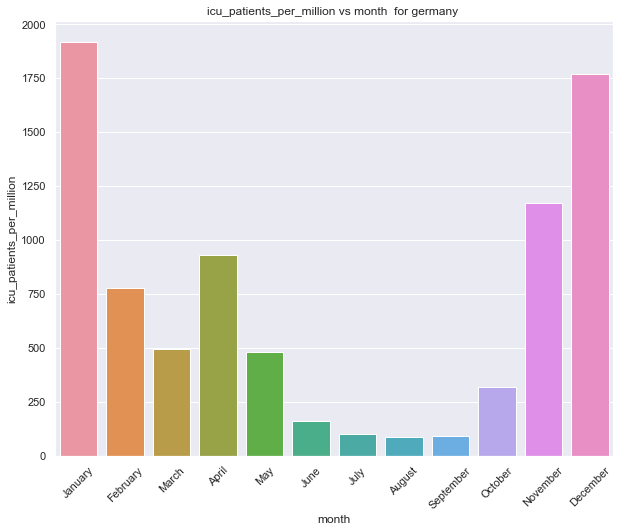

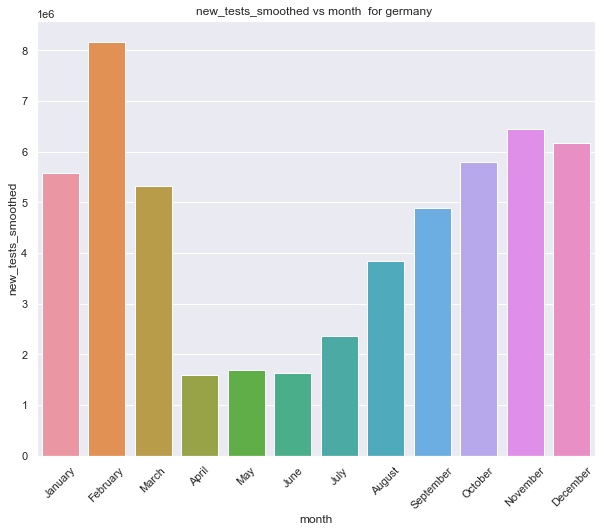

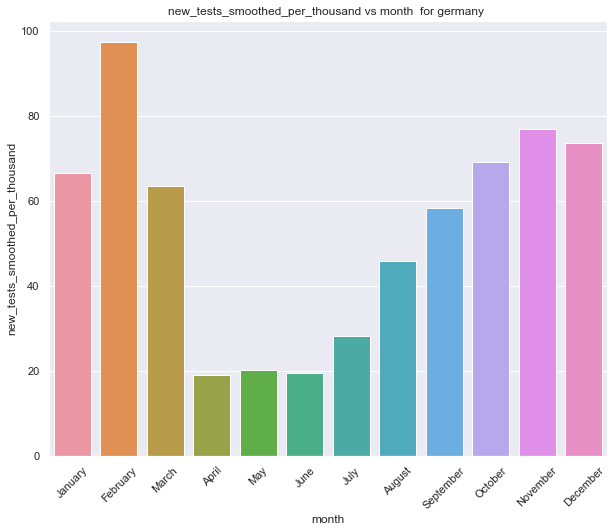

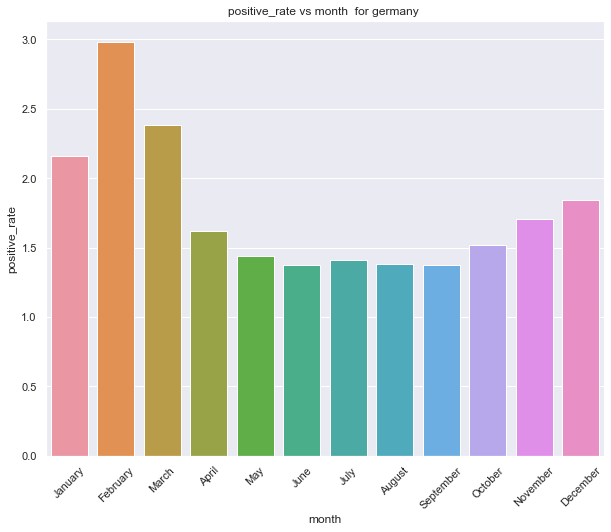

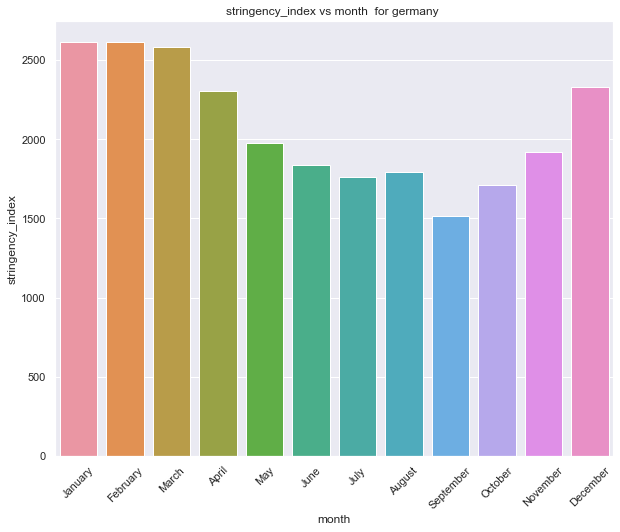

In [53]:
for i, feature in enumerate(df_grouped.columns):
    plt.figure(i)
    g = sns.barplot(x=df_grouped.index,y=feature,data=df_grouped,ci=None)
    g.set_xticklabels(df_grouped.index, rotation=45)
    g.set_title(feature +" vs month  for germany ")

## The below scatter plot gives the relation between how the each column vaires with respect to total_cases. 

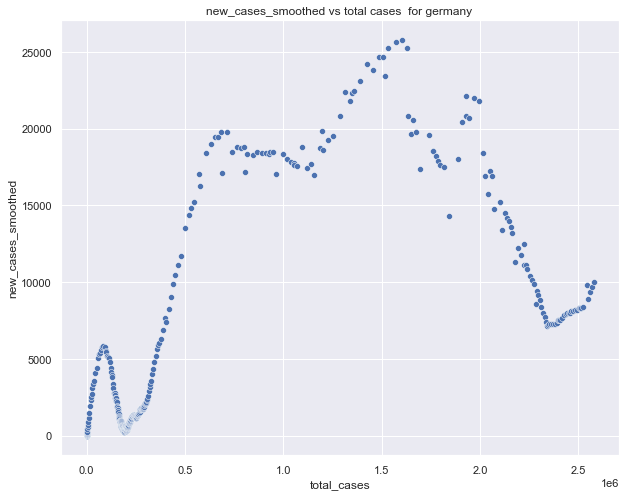

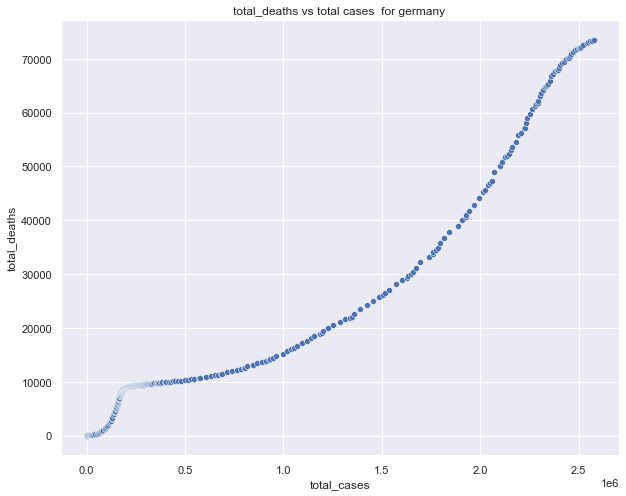

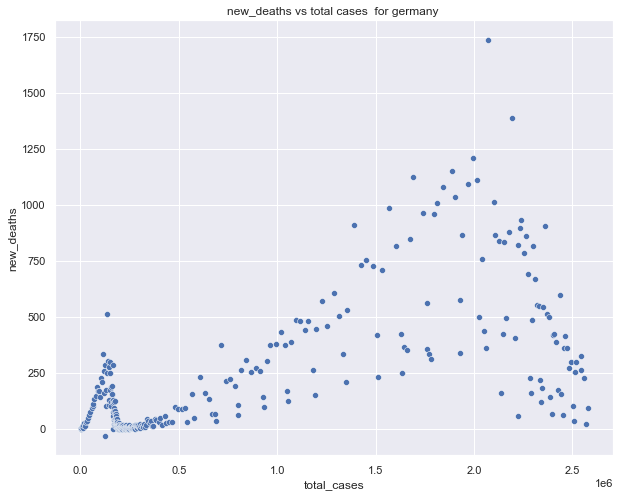

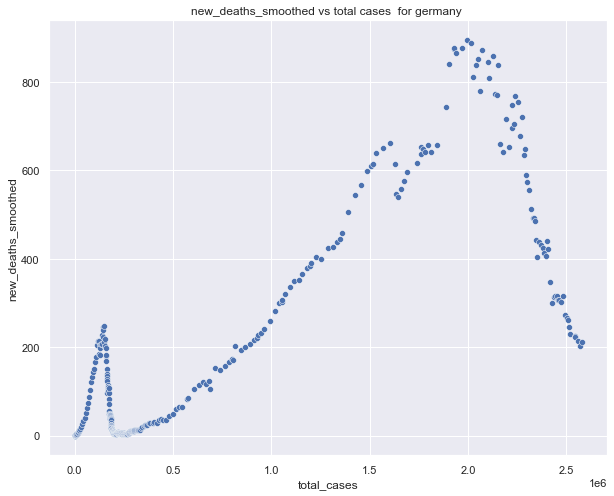

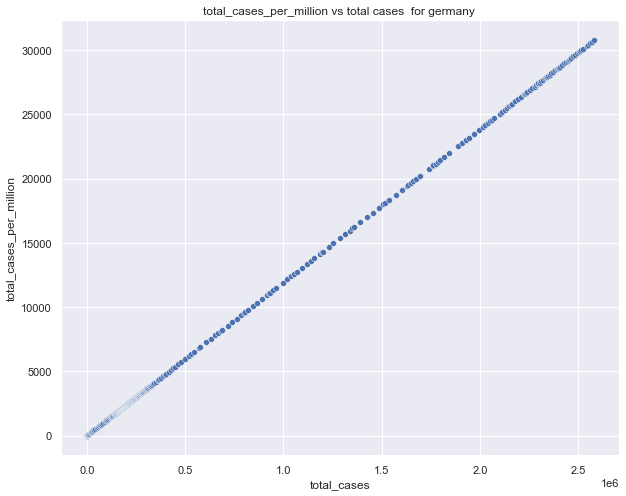

...

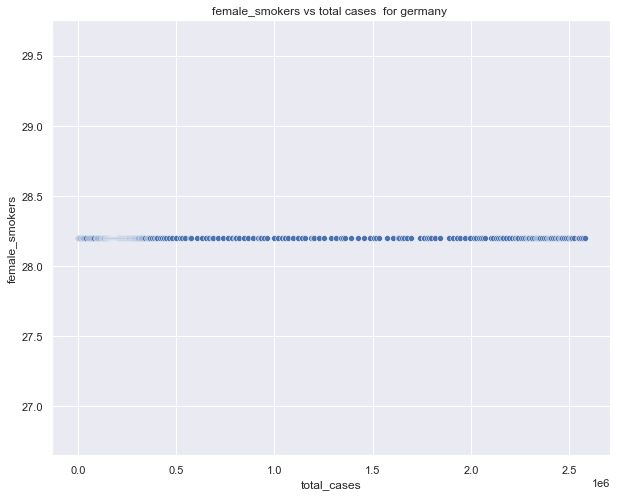

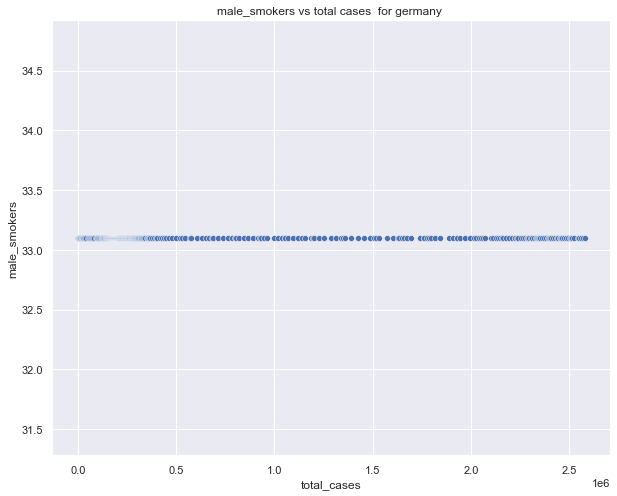

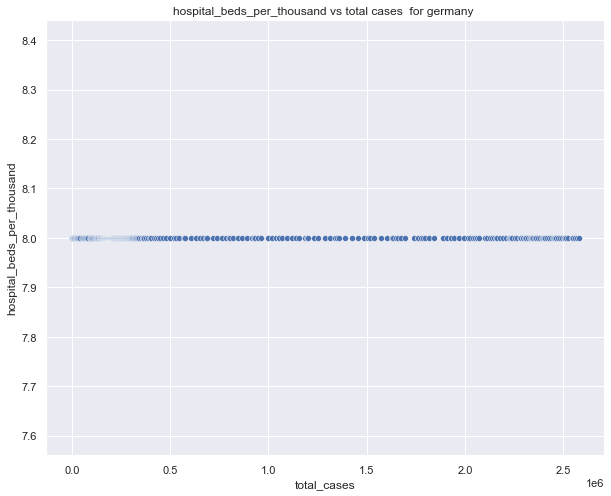

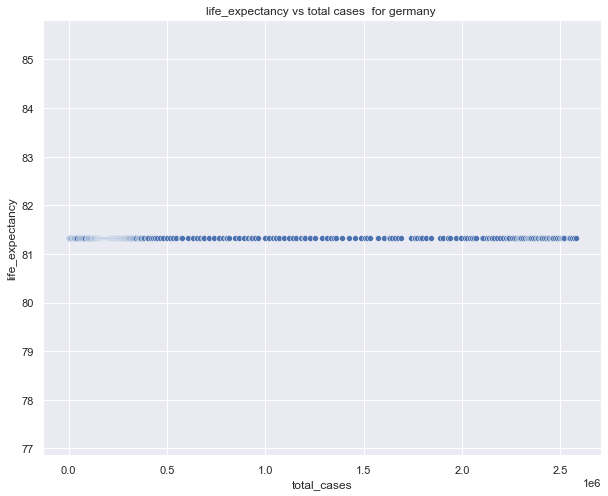

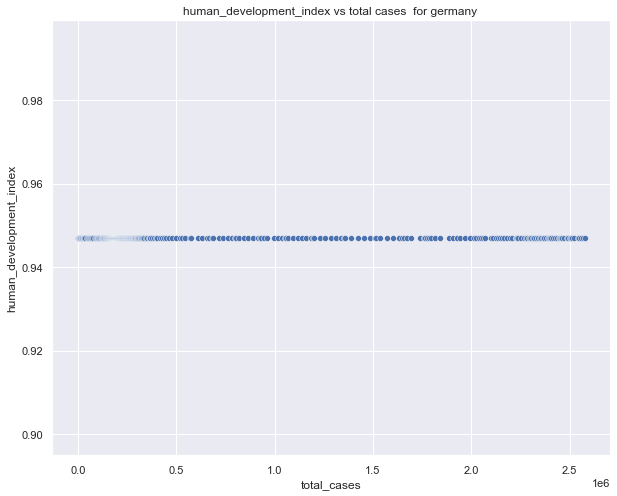

In [54]:
for i, feature in enumerate(df_germany_univar.columns[2:]):
    plt.figure(i)
    g = sns.scatterplot(x=df_germany_univar.total_cases,y=feature,data=df_germany_univar).set_title(feature +" vs total cases  for germany ")

## The below scatter plot gives the relation between how the each column vaires with respect to total_cases.

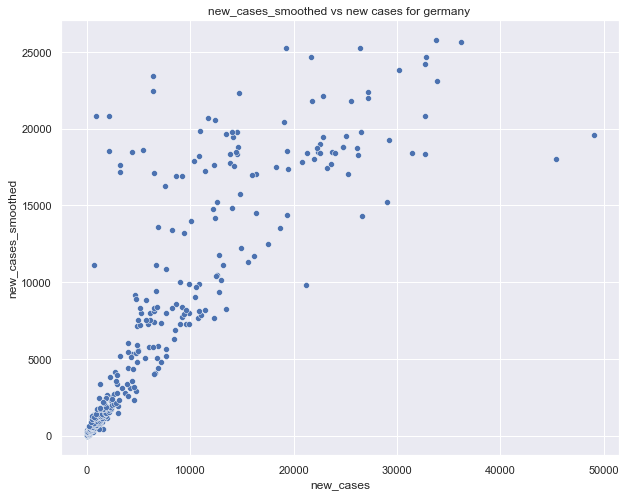

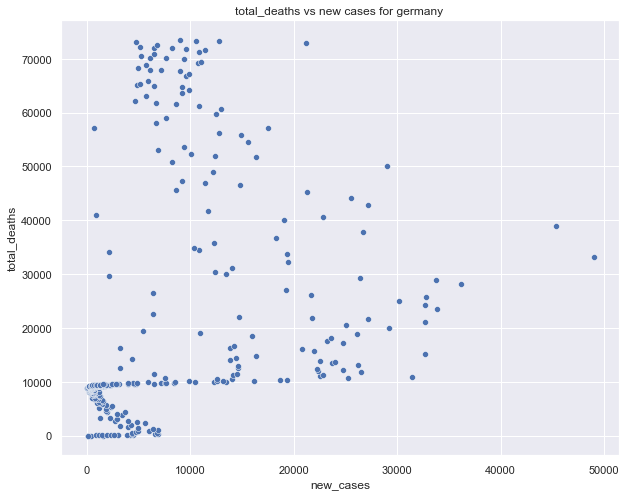

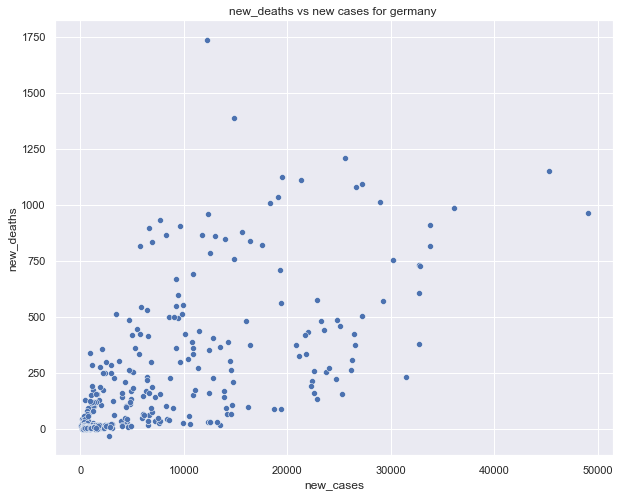

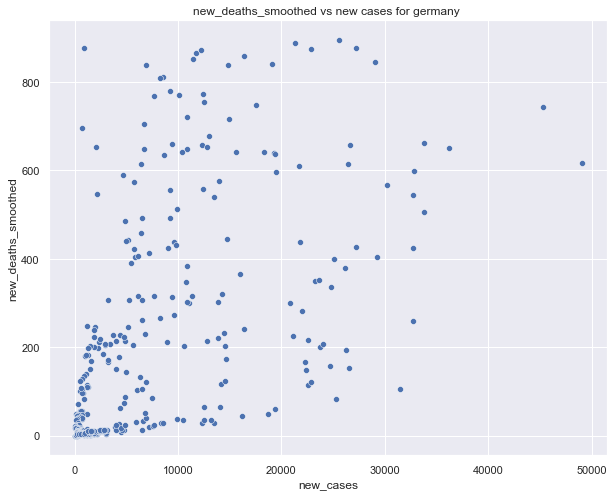

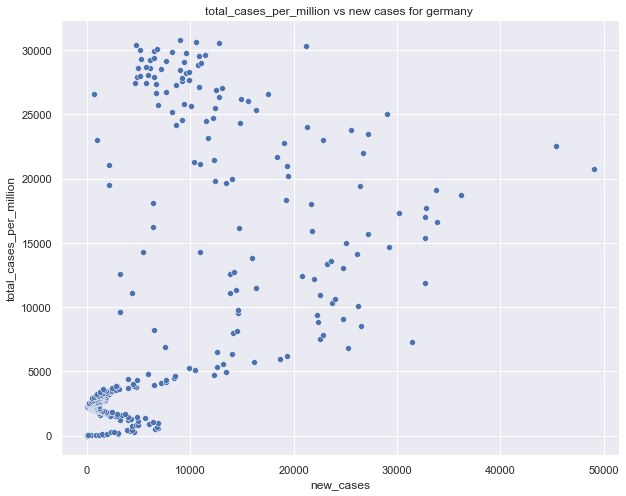

...

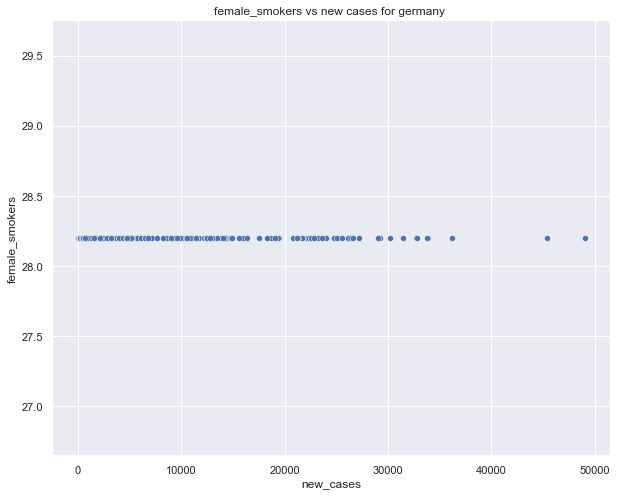

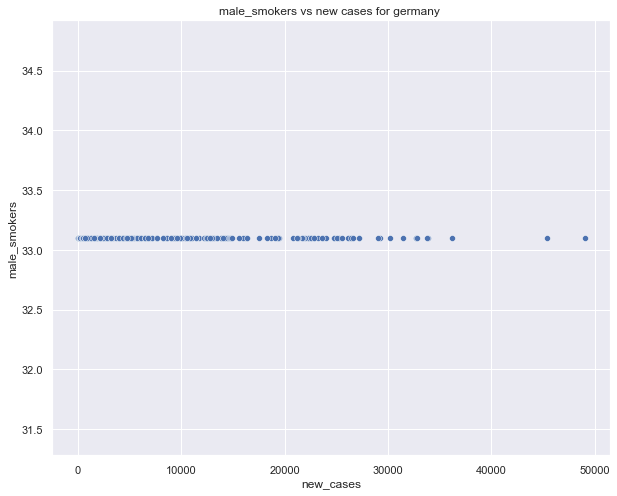

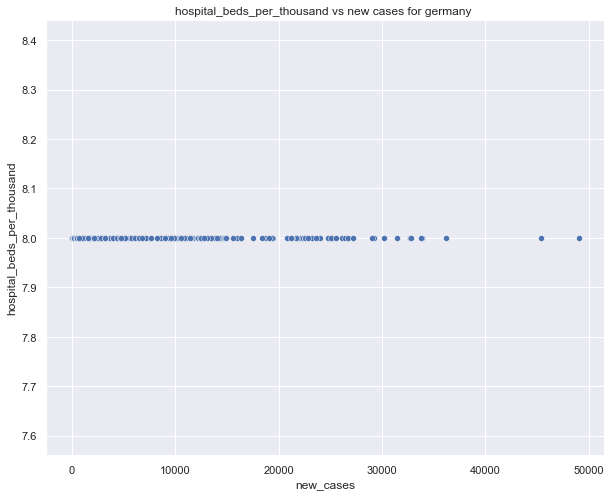

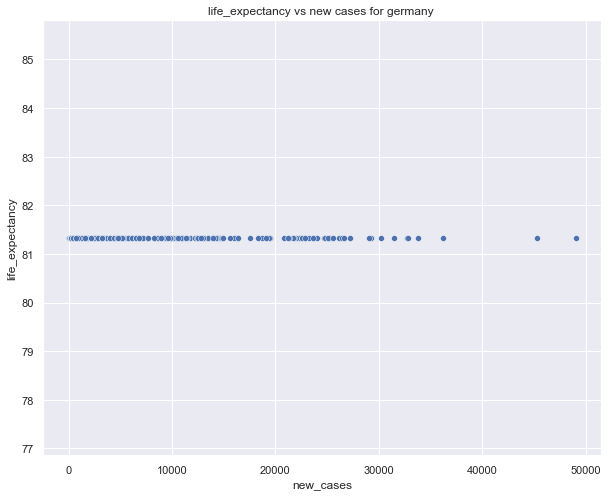

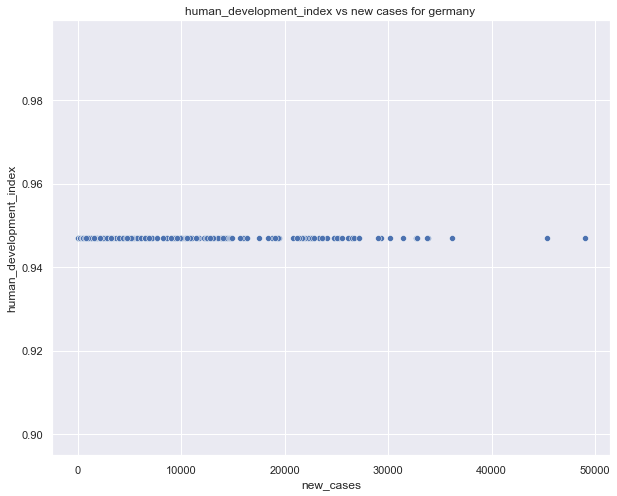

In [55]:
for i, feature in enumerate(df_germany_univar.columns[2:]):
    plt.figure(i)
    g = sns.scatterplot(x=df_germany_univar.new_cases,y=feature,data=df_germany_univar).set_title(feature +" vs new cases for germany ")

## The below scatter plot gives the relation between how the each column vaires with respect to recovered_cases.

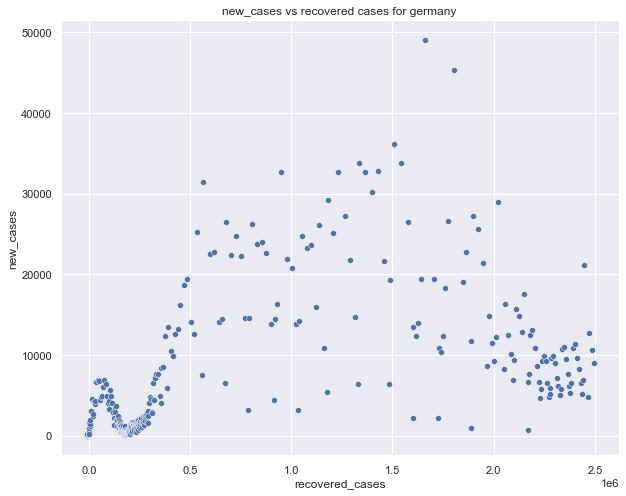

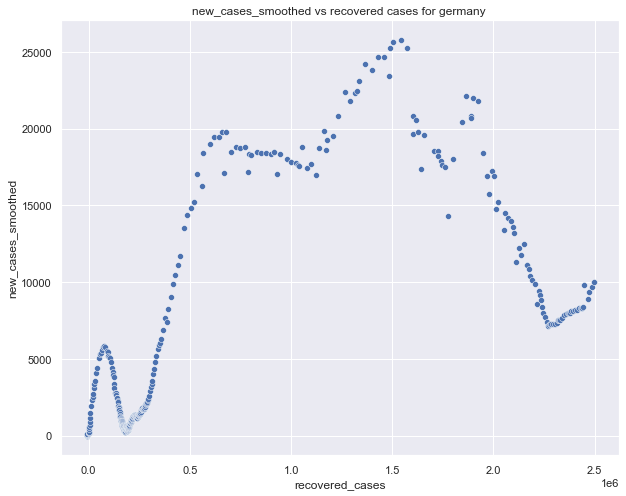

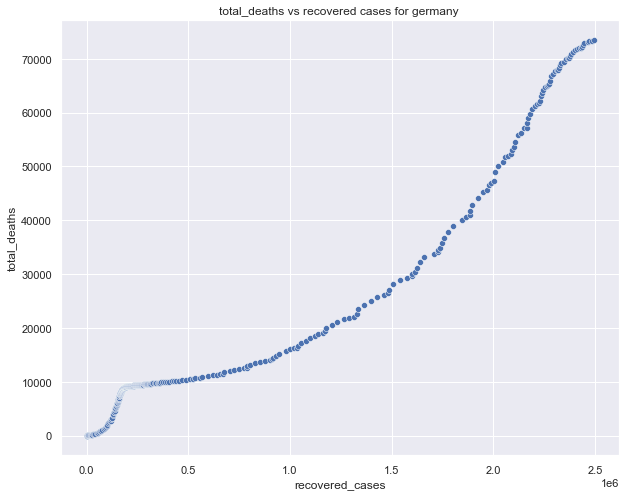

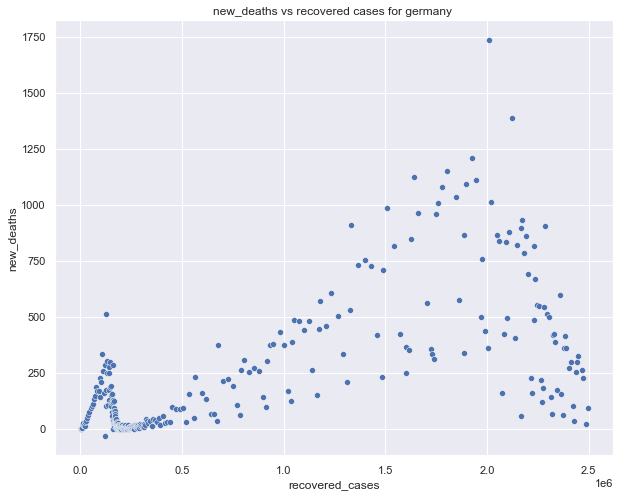

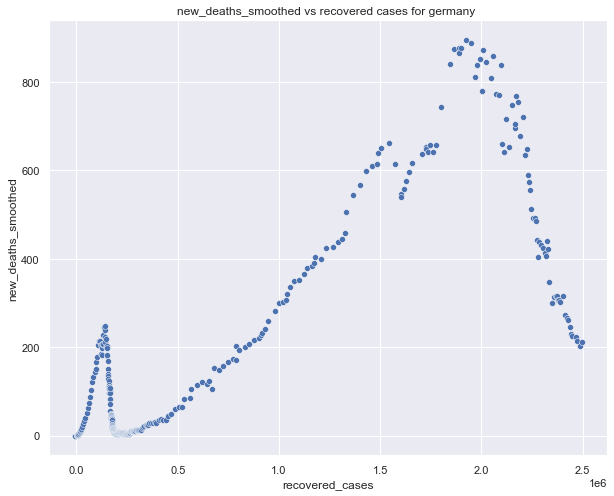

...

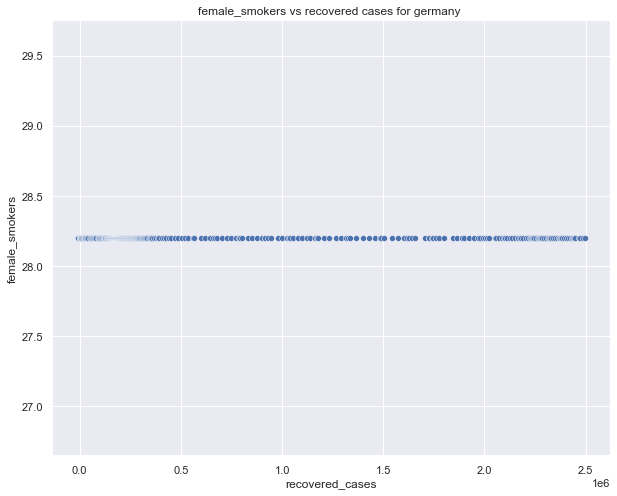

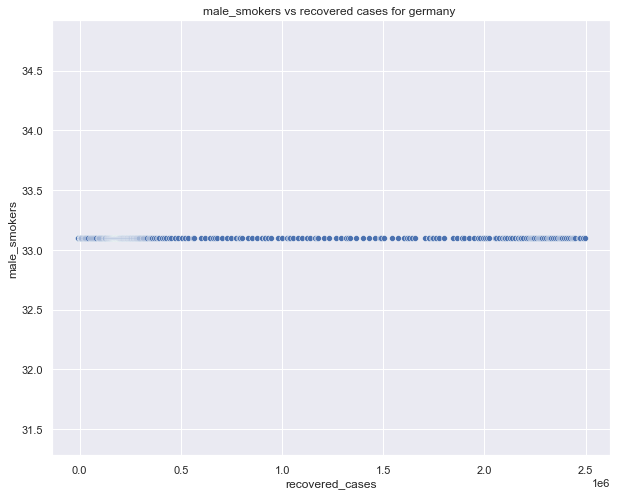

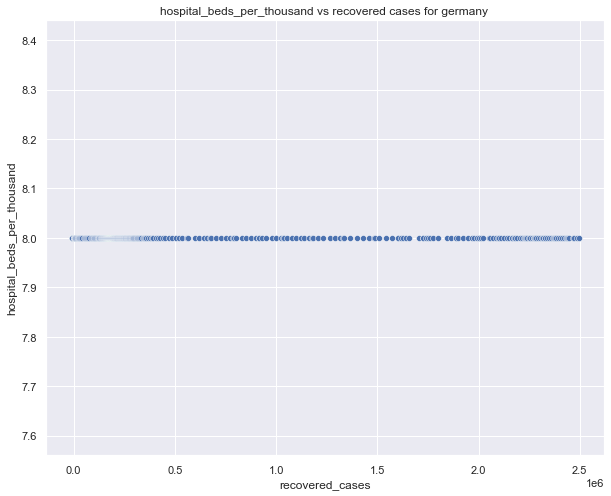

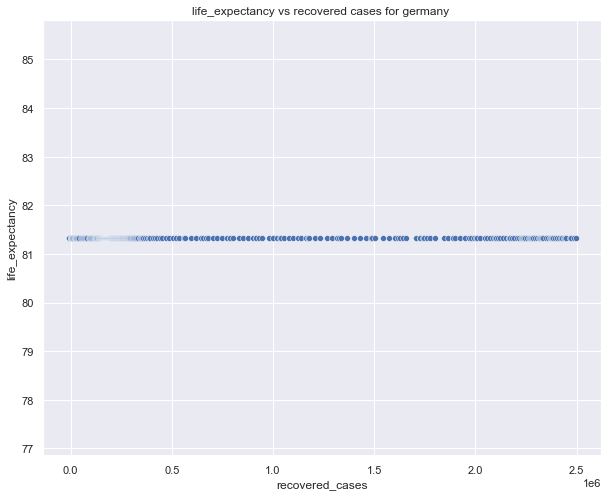

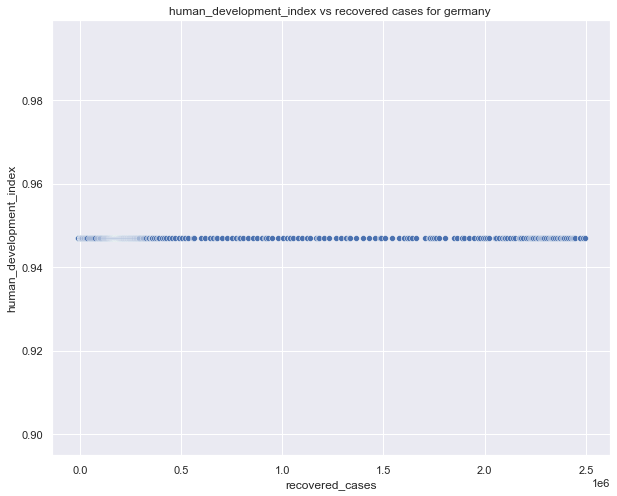

In [56]:
for i, feature in enumerate(df_germany_univar.columns[1:]):
    plt.figure(i)
    g = sns.scatterplot(x=df_germany.recovered_cases,y=feature,data=df_germany_univar).set_title(feature +" vs recovered cases for germany ")

## The below line plot shows variation of total_deaths, new_cases, total_cases and recovered_cases with respect each day.

Text(0.5, 1.0, 'Variation of total_deaths, new_cases, total_cases and recovered_cases with respect each day')

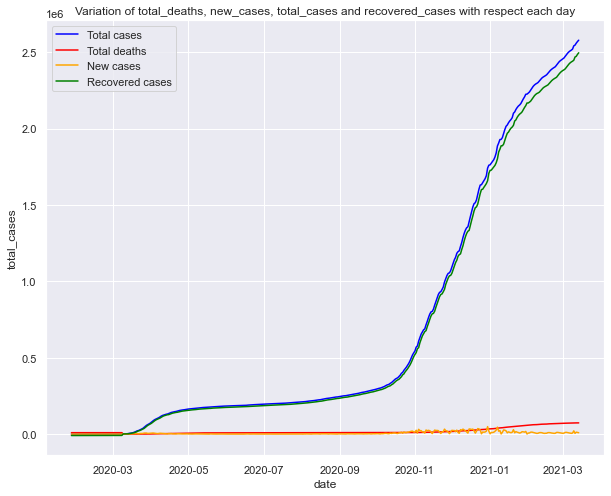

In [57]:
sns.lineplot(x=df_germany.date,y= df_germany.total_cases, color="blue", label="Total cases", linestyle="-")
sns.lineplot(x=df_germany.date, y= df_germany.total_deaths ,color="red", label="Total deaths", linestyle="-")
sns.lineplot(x=df_germany.date, y= df_germany.new_cases ,color="orange", label="New cases", linestyle="-")
sns.lineplot(x=df_germany.date ,y= df_germany.recovered_cases, color="green", label="Recovered cases", linestyle="-").set_title("Variation of total_deaths, new_cases, total_cases and recovered_cases with respect each day")

### We can see that in above picture when total_cases increase recovered_cases & total_deaths also increase.

### From above graph we can seen that many grapgh are rightly skewed, so taking cube root to reduce outliers.

In [58]:
df_germany[['new_cases','new_deaths','new_cases_smoothed','new_deaths','new_deaths_smoothed','new_cases_per_million','new_cases_smoothed_per_million','new_deaths_per_million','new_deaths_smoothed_per_million','stringency_index']] = np.cbrt(df_germany[['new_cases','new_deaths','new_cases_smoothed','new_deaths','new_deaths_smoothed','new_cases_per_million','new_cases_smoothed_per_million','new_deaths_per_million','new_deaths_smoothed_per_million','stringency_index']])

### positive_rate is higly skewed and has high outliers, so doing log transformtion.

In [59]:
df_germany['positive_rate'] = np.log(df_germany['positive_rate'])

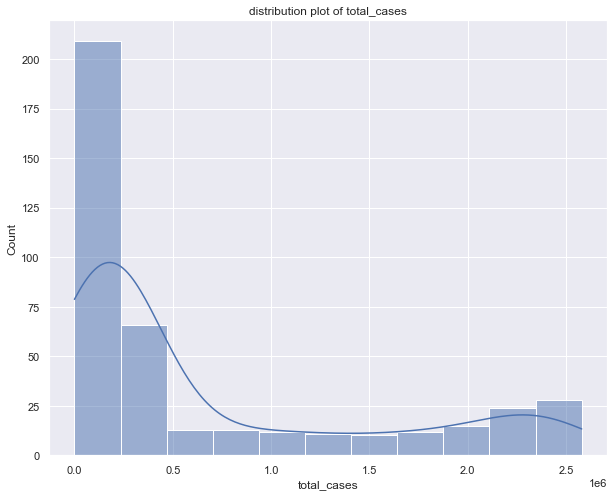

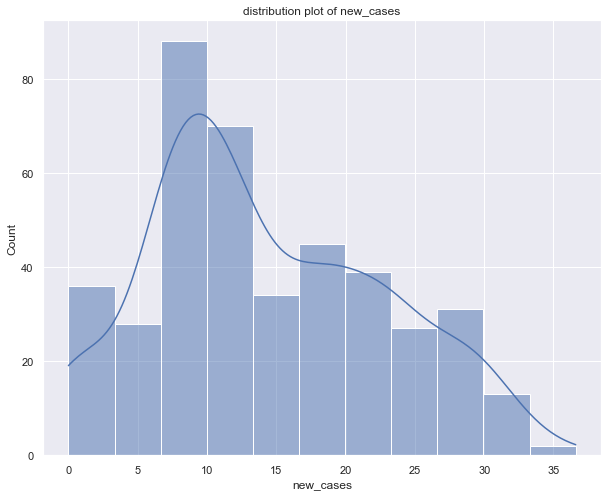

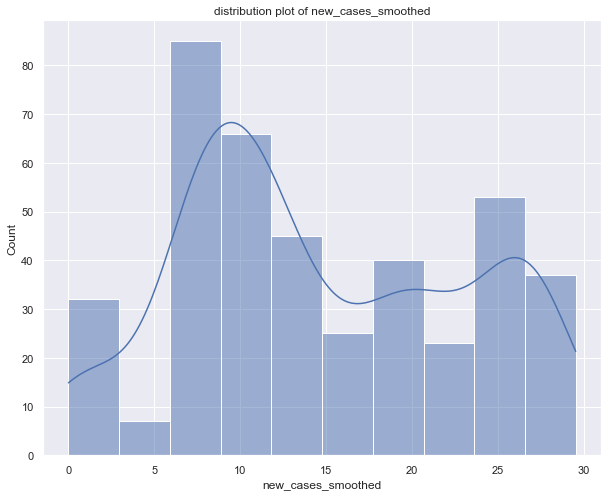

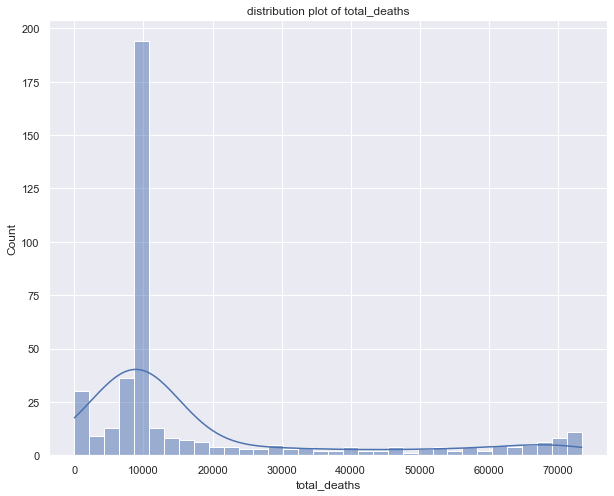

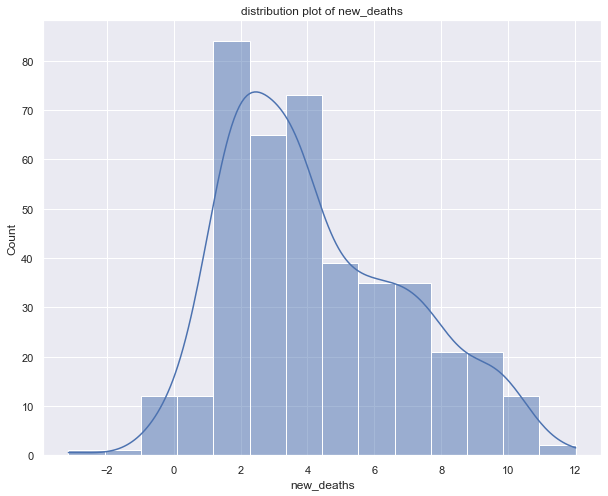

...

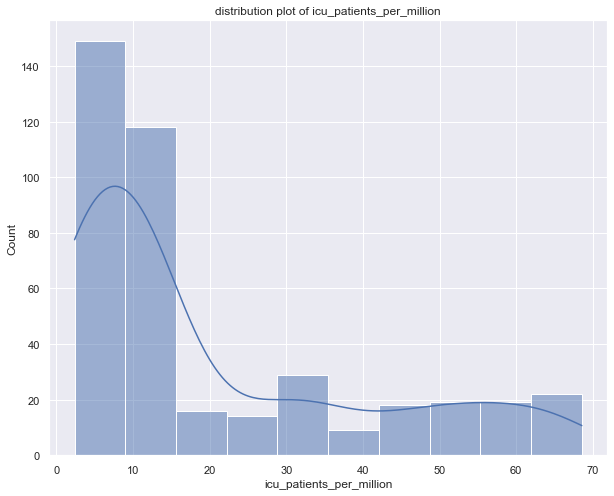

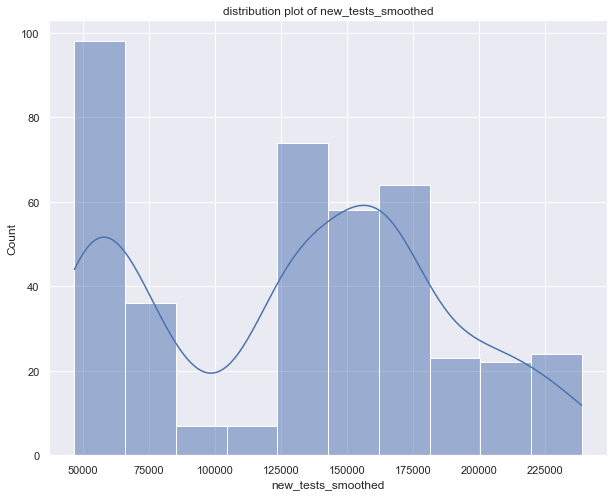

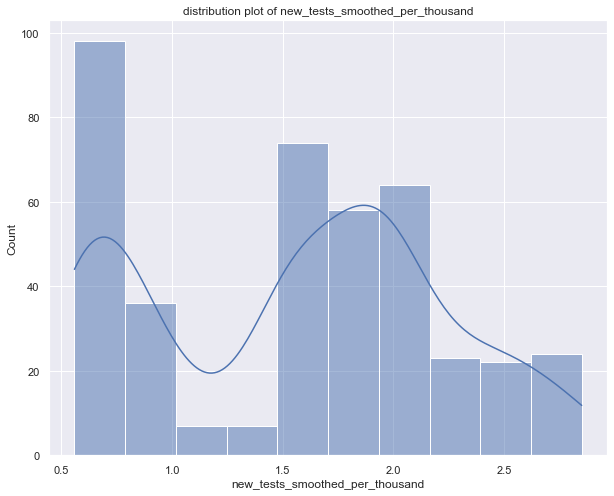

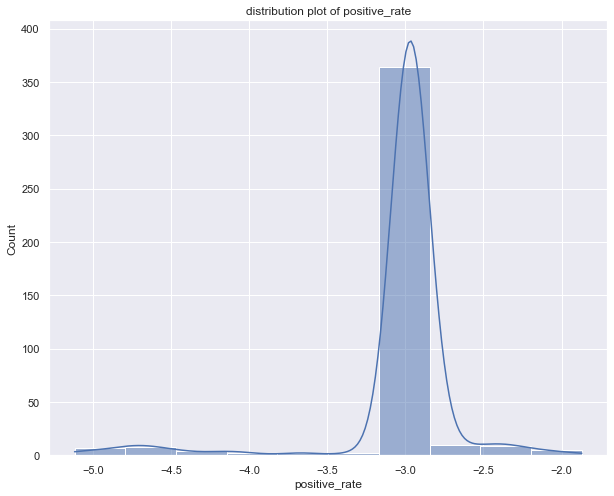

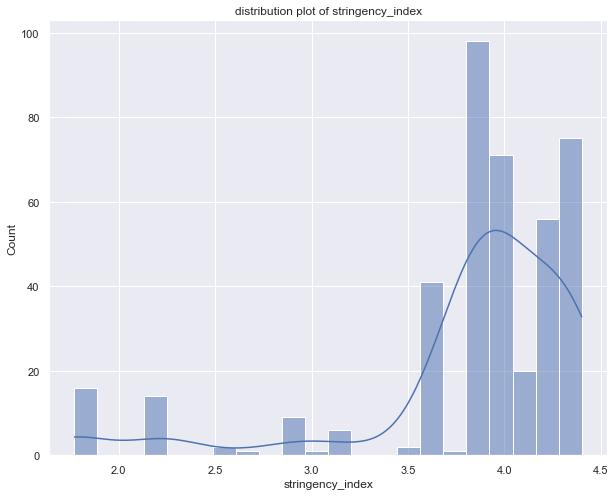

In [60]:
df_data  = df_germany.loc[:,'total_cases':'stringency_index']
df_data = df_data.select_dtypes([np.int, np.float])
for i, col in enumerate(df_data.columns):
    plt.figure(i)
    sns.histplot(x=col, data=df_data,kde=True).set_title("distribution plot of "+col)

# Normalizing the data using minmax scaler

In [61]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [62]:
df_germany.loc[:,'total_cases':"stringency_index"] = scaler.fit_transform(df_germany.loc[:,'total_cases':"stringency_index"])
df_germany[['recovered_cases']] = scaler.fit_transform(df_germany[['recovered_cases']])

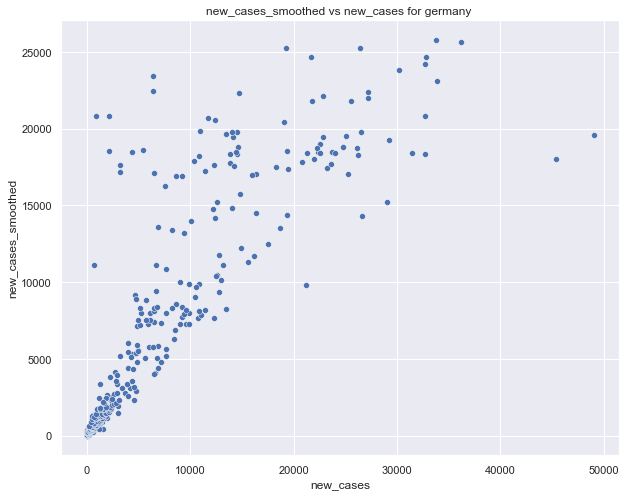

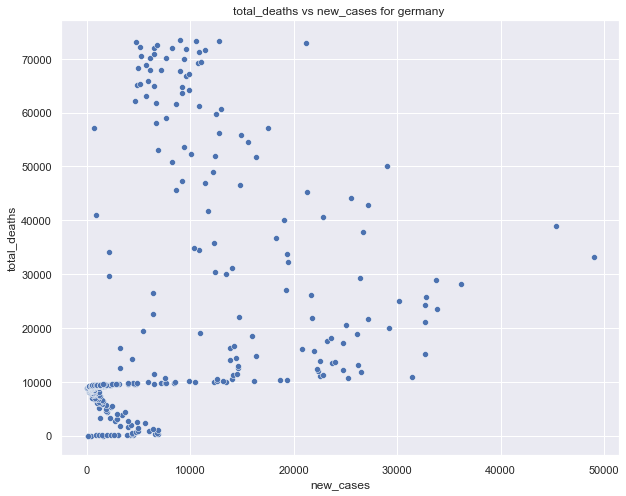

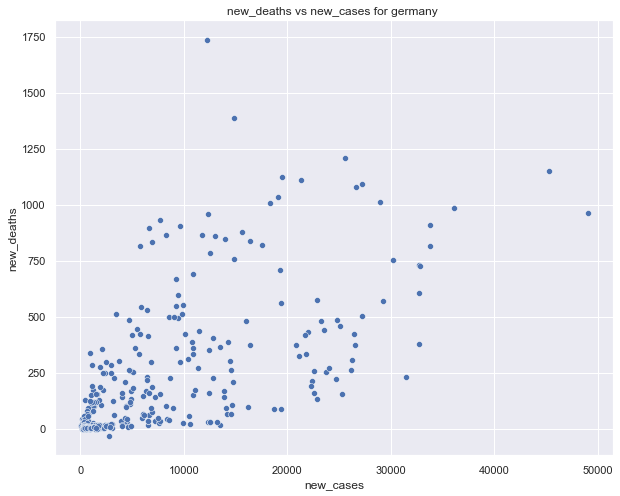

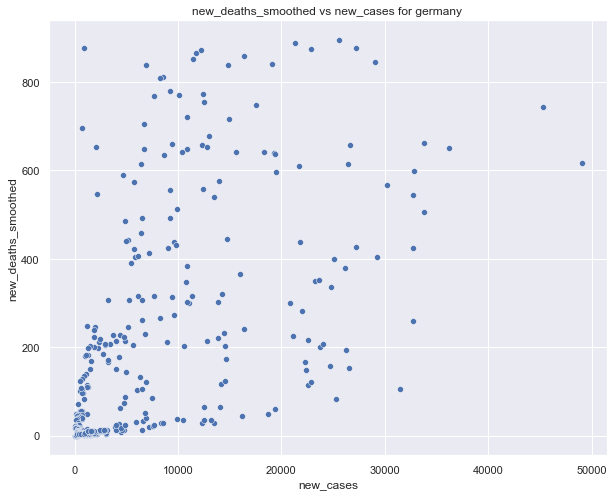

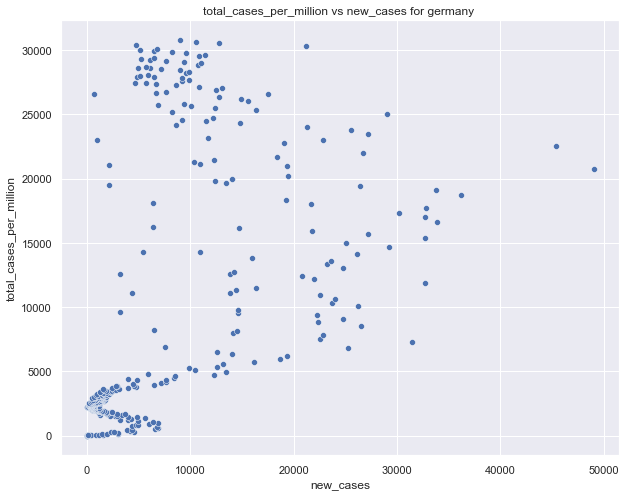

...

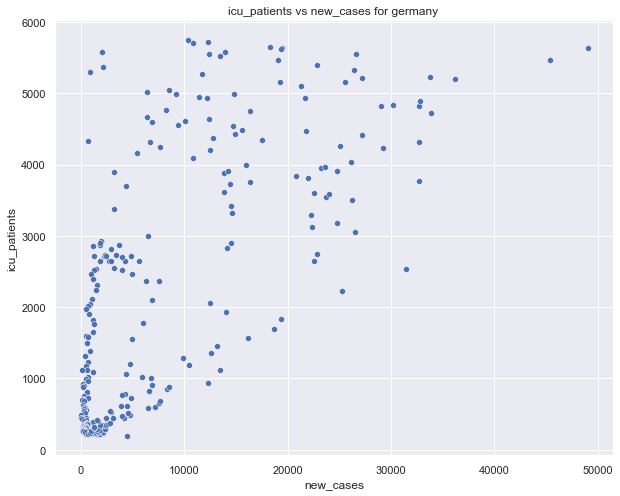

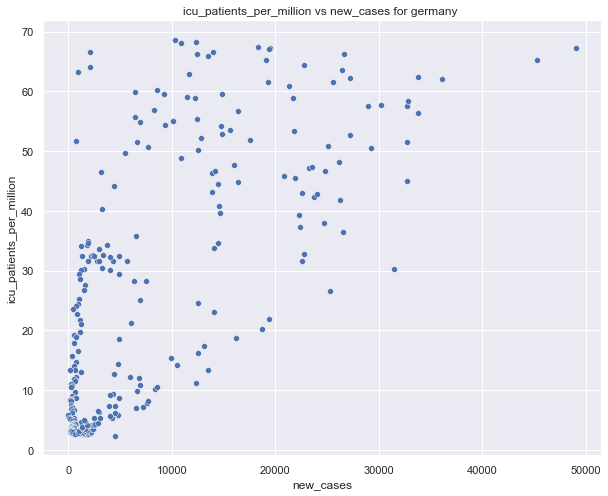

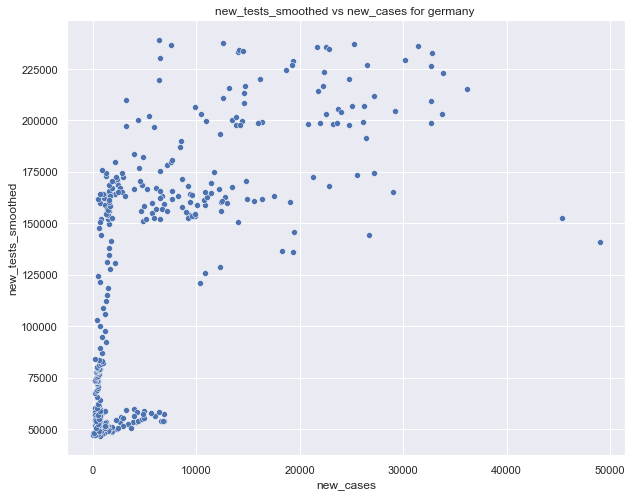

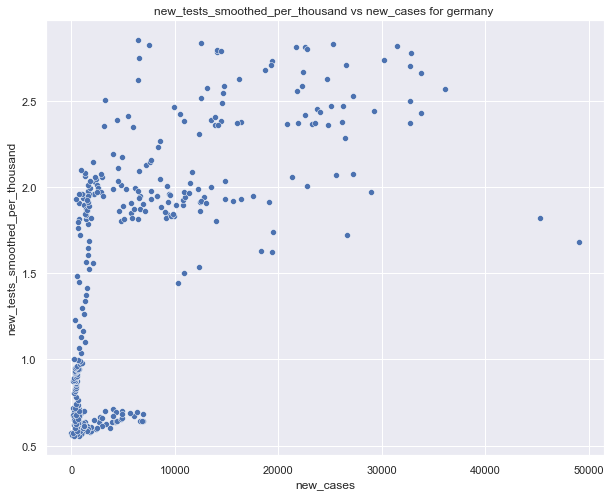

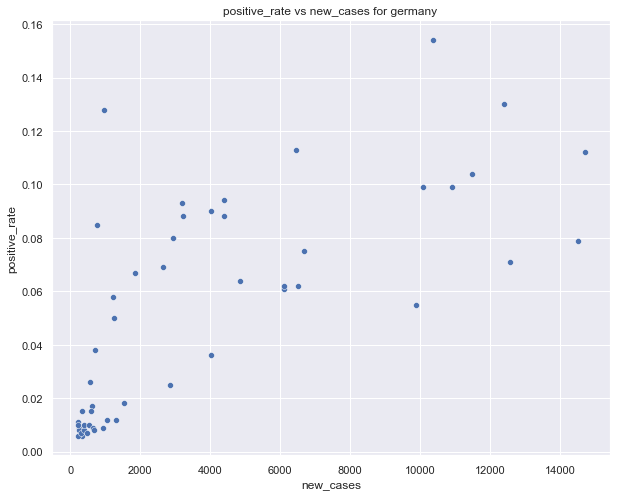

In [63]:
for i, feature in enumerate(df_germany.columns[4:20]):
    plt.figure(i)
    g = sns.scatterplot(x=df_germany_univar.new_cases,y=feature,data=df_germany_univar).set_title(feature +" vs new_cases for germany ")

### Based on the above graphs the following features have been chosen for traning

In [64]:
from sklearn.model_selection import train_test_split
X = df_germany[['total_cases','total_deaths', 'new_deaths', 'positive_rate','stringency_index','recovered_cases','new_tests_smoothed']]
y= df_germany['new_cases']
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.3, random_state=1)

print('Training set size:', X_train.shape, y_train.shape)
print('Test set size:', X_test.shape, y_test.shape)

Training set size: (289, 7) (289,)
Test set size: (124, 7) (124,)


In [65]:
from sklearn import linear_model
regr = linear_model.LinearRegression()

# Fitting the model on the train dataset
regr.fit (X_train, y_train)

# Predicting for the X_test points
Yhat =regr.predict(X_test)

print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

print("Test Data Score",regr.score(X_test,y_test))
print("Train Data Score",regr.score(X_train,y_train))

y_test = np.asanyarray(y_test)

from sklearn.metrics import r2_score

print("Mean absolute error: %.2f" % np.mean(np.absolute(Yhat - y_test)))
print("Residual sum of squares (MSE): %.2f" % np.mean((Yhat - y_test) ** 2))
print("R2-score: %.2f" % r2_score(Yhat ,y_test) )

Coefficients:  [ 35.60733497  -1.06386599   0.09809401   0.09180546   0.42666872
 -34.58090475   0.22204721]
Intercept:  -0.09721577509165152
Test Data Score 0.956832844709391
Train Data Score 0.9532283240036759
Mean absolute error: 0.04
Residual sum of squares (MSE): 0.00
R2-score: 0.96


### Grouping data in 2 sets, basically on month basis.

In [66]:
df_grouped1 = df_germany[ (df_germany['month'] != 'October' ) & ( df_germany['month'] != 'November' ) & ( df_germany['month'] != 'December' )]
print(df_grouped1.shape)
df_grouped2 =df_germany[(df_germany['month'] == 'October' ) | ( df_germany['month'] == 'November' ) | ( df_germany['month'] == 'December' )]
print(df_grouped2.shape)

(321, 28)
(92, 28)


In [67]:
from sklearn.model_selection import train_test_split
X1 = df_grouped1[['total_cases','total_deaths', 'new_deaths', 'positive_rate','stringency_index','recovered_cases','new_tests_smoothed']]
y1= df_grouped1['new_cases']

from sklearn import linear_model
regr1 = linear_model.LinearRegression()
regr1.fit (X1, y1)
print("Test Data Score:",regr1.score(X1,y1))

x = np.array(df_grouped2[['total_cases','total_deaths', 'new_deaths', 'positive_rate','stringency_index','recovered_cases','new_tests_smoothed']])
Yhat2 =regr1.predict(x)
y_test2 = np.asanyarray(df_grouped2['new_cases'])
print("Regression Score of 2 months:",regr1.score(x,y_test2))

from sklearn.metrics import r2_score
print("Mean absolute error: %.2f" % np.mean(np.absolute(Yhat2 - y_test2)))
print("Residual sum of squares (MSE): %.2f" % np.mean((Yhat2 - y_test2) ** 2))
print("R2-score: %.2f" % r2_score(Yhat2 ,y_test2))

Test Data Score: 0.9411693585606216
Regression Score of 2 months: 0.826162620964592
Mean absolute error: 0.05
Residual sum of squares (MSE): 0.00
R2-score: 0.90


Text(0.5, 1.0, 'Actual vs the predicted values')

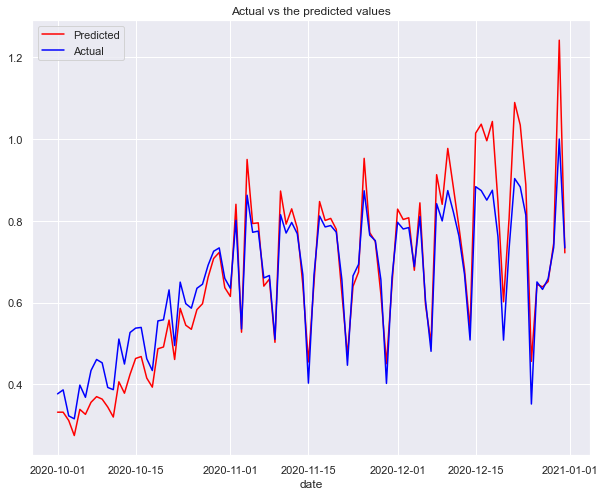

In [68]:
sns.lineplot(x= df_grouped2.date, y=Yhat2, color="red", label="Predicted")
sns.lineplot(x= df_grouped2.date, y=y_test2, color="blue", label="Actual").set_title("Actual vs the predicted values")

# SIR MODEL

### STEPS:
    - Define the parameters
    - Formulate the differential equations
    - Integrate the equations over time

In [69]:
# Country- Germany
N = df_germany['population'][0]
beta = df_germany['reproduction_rate'].mean()
D = 14                               #reproduction rate
gamma = 1/D                          #removal rate
beta

KeyError: 0

In [180]:
def deriv(x, t, beta, gamma):
    s, i, r = x
    dsdt = -(beta * s * i)/N
    didt = (beta * s * i)/N -gamma * i
    drdt = gamma * i
    return [dsdt, didt, drdt]

In [181]:
#initial conditions
i0 = 1
r0 = 0
s0 = N- i0 - r0

NameError: name 'N' is not defined

In [182]:
from scipy.integrate import odeint

In [183]:
t = np.linspace(0, 200, 200)
x0 = s0, i0, r0

NameError: name 's0' is not defined

In [184]:
#solving the set of diff equations using scipy's odeint function
soln = odeint(deriv, x0, t, args=(beta, gamma))
s, i, r = soln.T

NameError: name 'x0' is not defined

In [ ]:
fig = plt.figure()
ax= fid.add_subplot(1, 1, 1)

ax.plot(t, s, 'b', lw=3, label='Fraction Susceptible')
ax.plot(t, i, 'r', lw=3, label='Fraction Susceptible')
ax.plot(t, r, 'g', lw=3, label='Fraction Susceptible')
ax.set_title('Susceptible and Recovered Population')
ax.set_xlabel('Time /days')
ax.set_ylabel('Fraction')